# Import Packages

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
from PIL import Image 
import pydicom as dicom



from scipy.fft import fft, fftfreq
import itertools
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from sklearn.metrics import auc
from tkinter.filedialog import askdirectory
import tkinter as tk

import statsmodels.api as sm
import matplotlib.pyplot as plt
from statsmodels.distributions.mixture_rvs import mixture_rvs

import os
import csv
import pandas as pd

import pydicom as dicom

import imageio

# EXPERIMENT 1
Eppendorf not full of water

## Extract Masks

In [2]:
patM = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing'

MS = np.asarray(Image.open(patM+'/MaskScaffold.png'))/255
ME = np.asarray(Image.open(patM+'/MaskEppen.png'))/255
MB = np.asarray(Image.open(patM+'/MaskBack.png'))/255


In [3]:
MA = np.asarray(Image.open(patM+'/MaskAll.png'))/255


In [4]:
pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/DifussionEppendorf'
fol = '12'

ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

# ds.astype(np.int64) 

ds


Array([[259.66916 , 171.39432 , 241.03738 , ..., 114.50407 , 103.56015 ,
        236.15332 ],
       [358.9784  , 289.60666 , 102.022575, ..., 180.25798 , 126.17154 ,
        246.73546 ],
       [ 89.26975 , 161.26442 , 328.046   , ..., 331.75427 , 178.35863 ,
         20.259804],
       ...,
       [ 71.99466 , 111.15758 , 181.16243 , ..., 316.83075 , 248.9966  ,
        266.63348 ],
       [147.5167  ,  87.822624,  89.81243 , ...,  27.766783, 272.60287 ,
        254.51378 ],
       [222.76738 , 186.58917 , 190.56877 , ..., 186.40828 ,  90.89777 ,
        187.49362 ]], dtype=float32)

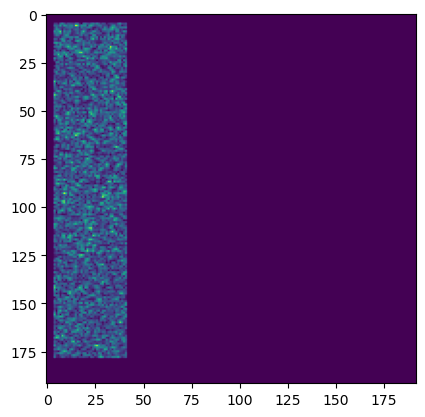

In [6]:

k = 0
fol = str(list(range(12, 38))[k])
ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')


plt.imshow(ds*MB)


# [(ds*MB)[i,j] for i in range(0,np.shape(MB)[0]) for j in range(0,np.shape(MB)[1]) if (ds*MB)[i,j] != 0]

# plt.hist(np.reshape(ds*MB, (1, 192*192)))

(array([3.0925e+04, 1.5880e+03, 1.7630e+03, 1.3450e+03, 7.7200e+02,
        3.1900e+02, 1.1700e+02, 2.5000e+01, 8.0000e+00, 2.0000e+00]),
 array([  0.        ,  79.51972656, 159.03945312, 238.55917969,
        318.07890625, 397.59863281, 477.11835937, 556.63808594,
        636.1578125 , 715.67753906, 795.19726562]),
 <BarContainer object of 10 artists>)

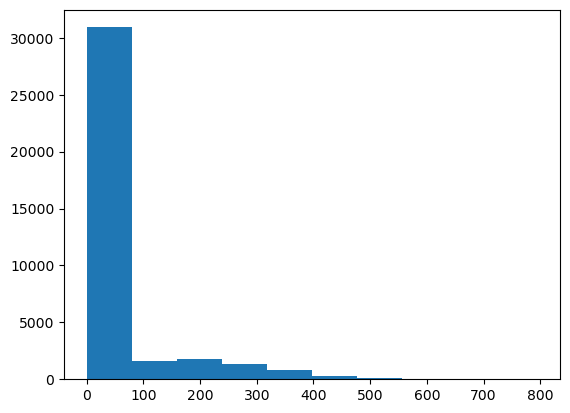

In [7]:
# np.shape(ds*MB)
mm=np.reshape(ds*MB, (1, 192*192))

plt.hist(mm[0])

### Extract Data

In [8]:
exper = '1'

pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/DifussionEppendorf'
# fol = '12'
ScaffDat = dict()
EppenDat = dict()
BackgDat = dict()
AllDat = dict()

if os.path.exists(pat+'/tmpDat') == False:
    os.mkdir(pat+'/tmpDat')


if os.path.exists(pat+'/tmpDat/ScaffDat'+exper+'.csv'):
    df2 = pd.read_csv(pat+'/tmpDat/ScaffDat'+exper+'.csv')
    ScaffDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/EppenDat'+exper+'.csv')
    EppenDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/BackgDat'+exper+'.csv')
    BackgDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/AllDat'+exper+'.csv')
    AllDat=df2.to_dict(orient='list')

else:
    for k in range(0,26):
        fol = str(list(range(12, 38))[k])
        ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

        ScaffDat[str(k)] = [(ds*MS)[i,j] for i in range(0,np.shape(MS)[0]) for j in range(0,np.shape(MS)[1]) if (ds*MS)[i,j] != 0]
        EppenDat[str(k)] = [(ds*ME)[i,j] for i in range(0,np.shape(ME)[0]) for j in range(0,np.shape(ME)[1]) if (ds*ME)[i,j] != 0]
        BackgDat[str(k)] = [(ds*MB)[i,j] for i in range(0,np.shape(MB)[0]) for j in range(0,np.shape(MB)[1]) if (ds*MB)[i,j] != 0]
        AllDat[str(k)] = [(ds*MA)[i,j] for i in range(0,np.shape(MA)[0]) for j in range(0,np.shape(MA)[1]) if (ds*MA)[i,j] != 0]

    df = pd.DataFrame.from_dict(ScaffDat)
    df.to_csv(pat+'/tmpDat/ScaffDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(EppenDat)
    df.to_csv(pat+'/tmpDat/EppenDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(BackgDat)
    df.to_csv(pat+'/tmpDat/BackgDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(AllDat)
    df.to_csv(pat+'/tmpDat/AllDat'+exper+'.csv', index=False)

In [9]:
AllImg = dict()
for k in range(0,26):
    fol = str(list(range(12, 38))[k])
    ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

    AllImg[str(k)] = [(ds)[i,j] for i in range(0,np.shape(MA)[0]) for j in range(0,np.shape(MA)[1]) if (ds)[i,j] != 0]

268.52148
218.426


(array([2.6155e+04, 9.0890e+03, 5.8900e+02, 3.2400e+02, 2.6300e+02,
        2.0200e+02, 1.0100e+02, 8.4000e+01, 4.6000e+01, 1.1000e+01]),
 array([9.04455483e-01, 2.97167877e+02, 5.93431335e+02, 8.89694763e+02,
        1.18595825e+03, 1.48222168e+03, 1.77848511e+03, 2.07474854e+03,
        2.37101196e+03, 2.66727539e+03, 2.96353882e+03]),
 <BarContainer object of 10 artists>)

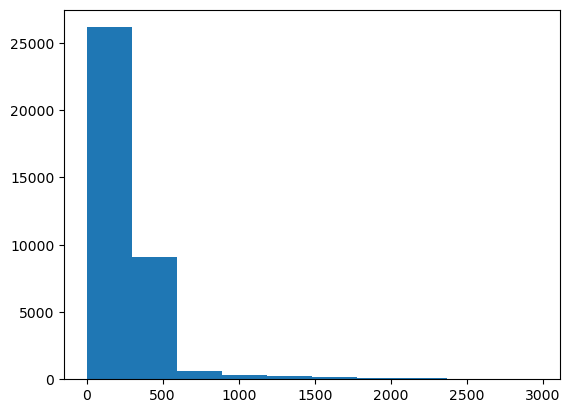

In [10]:
print(np.mean(AllImg['0']))
print(np.median(AllImg['0']))
plt.hist(AllImg['0'])


252.45027
226.76967


(array([6.7990e+03, 1.2937e+04, 9.6520e+03, 4.5910e+03, 1.7800e+03,
        7.1500e+02, 2.5900e+02, 1.0300e+02, 2.4000e+01, 4.0000e+00]),
 array([8.38267803e-01, 1.20174805e+02, 2.39511337e+02, 3.58847870e+02,
        4.78184418e+02, 5.97520935e+02, 7.16857483e+02, 8.36194031e+02,
        9.55530518e+02, 1.07486707e+03, 1.19420361e+03]),
 <BarContainer object of 10 artists>)

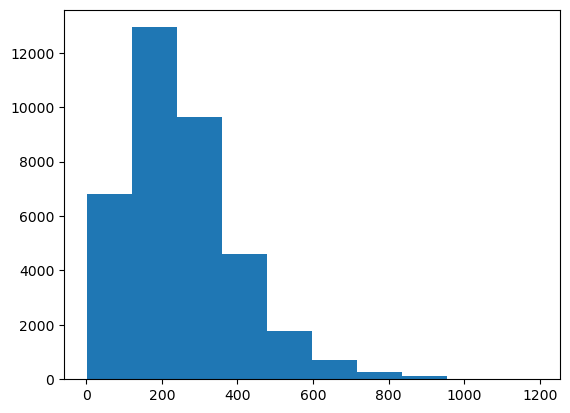

In [11]:
print(np.mean(AllImg['6']))
print(np.median(AllImg['6']))

plt.hist(AllImg['6'])

### Plot Data

In [12]:
SDM = [np.mean(ScaffDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 26)]
SDS = [np.std(ScaffDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 26)]

In [13]:
EDM = [np.mean(EppenDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 26)]
EDS = [np.std(EppenDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 26)]

In [14]:
FDM = [np.mean(AllDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 26)]
FDS = [np.std(AllDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 26)]

In [15]:
FDMb = [np.mean(AllImg[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 26)]
FDSb = [np.std(AllImg[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 26)]

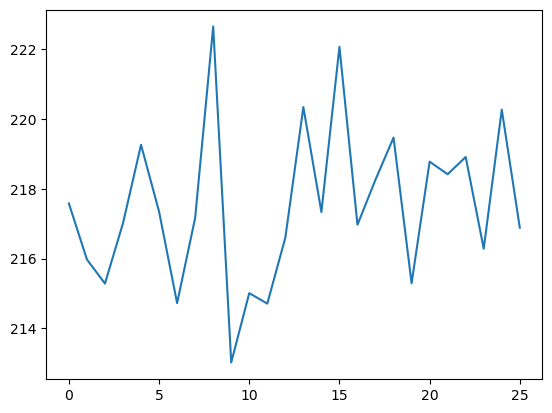

In [16]:
plt.plot([np.mean(BackgDat[str(k)])  for k in range(0, 26)])

In [17]:
tp = list(range(0,26))


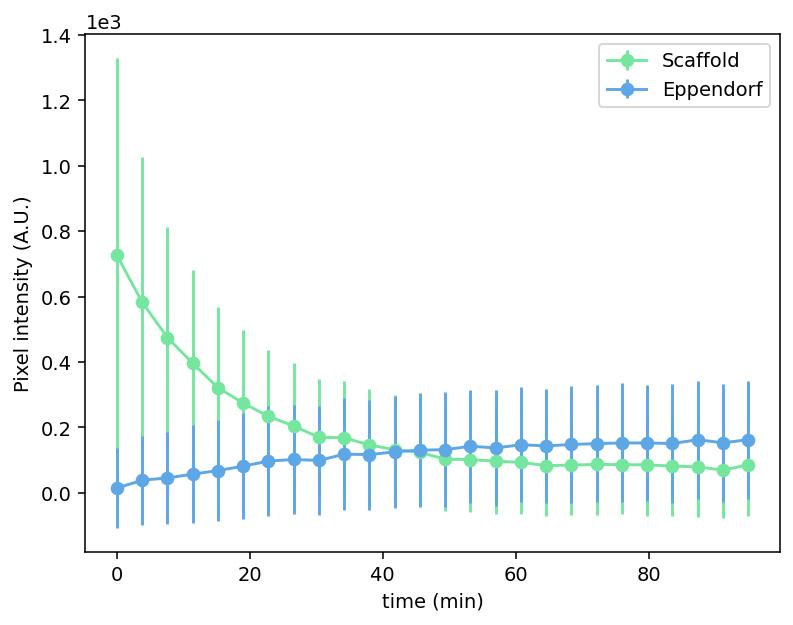

In [18]:
k = 0

plt.figure(dpi=140)

plt.errorbar([tp[i]*3.8 for i in range(0, len(tp))], SDM, yerr=SDS, fmt='-o', label='Scaffold', color='#75E69E')
plt.errorbar([tp[i]*3.8 for i in range(0, len(tp))], EDM, yerr=EDS, fmt='-o', label='Eppendorf', color='#5EA7E6')

plt.xlabel('time (min)')
plt.ylabel('Pixel intensity (A.U.)')

plt.legend()
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))


plt.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/DatErr.svg')

plt.show()

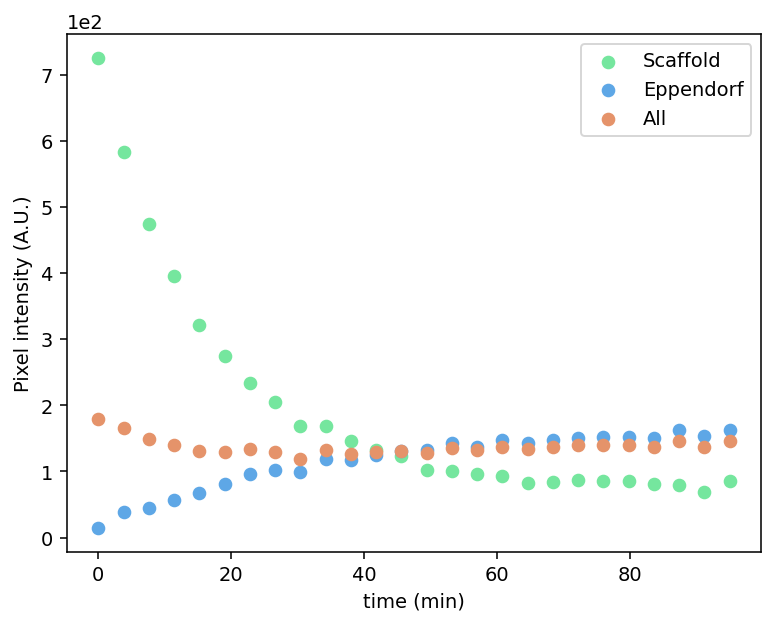

In [19]:
k = 0

plt.figure(dpi=140)

plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], SDM,  label='Scaffold', color='#75E69E')
plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], EDM,   label='Eppendorf', color='#5EA7E6')
plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], FDM,   label='All', color='#E5936A')
# plt.scatter(tp, [FDMb[i]*10 for i in range(0,len(FDMb))],   label='All')

plt.xlabel('time (min)')
plt.ylabel('Pixel intensity (A.U.)')

plt.legend()
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

plt.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/DatAll.svg')


plt.show()

In [20]:
pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/DifussionEppendorf'
# fol = '12.'
Imagedict = dict()


for k in range(0,26):
    fol = str(list(range(12, 38))[k])
    Imagedict[str(k)] = dicom.dcmread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm').pixel_array



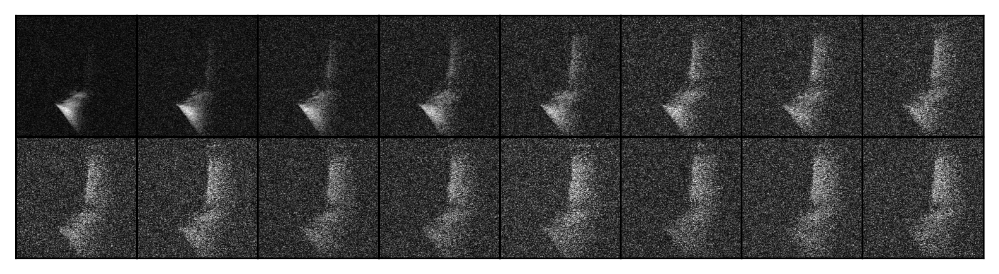

In [21]:

fig, axs = plt.subplots(2, 8, dpi = 480, figsize = (6.8,2))
fig.subplots_adjust(left=0, wspace=0, hspace=0)

ax1 = axs[0, 0]
ds1 = Imagedict['0']
ax1.set_xticks([]) 
ax1.set_yticks([])

ax2 = axs[0, 1]
ds2 = Imagedict['1']
ax2.set_xticks([]) 
ax2.set_yticks([])

ax3 = axs[0, 2]
ds3 = Imagedict['2']
ax3.set_xticks([]) 
ax3.set_yticks([])

ax4 = axs[0, 3]
ds4 = Imagedict['3']
ax4.set_xticks([]) 
ax4.set_yticks([])

ax5 = axs[0, 4]
ds5= Imagedict['4']
ax5.set_xticks([]) 
ax5.set_yticks([])

ax6 = axs[0, 5]
ds6 = Imagedict['5']
ax6.set_xticks([]) 
ax6.set_yticks([])

ax7 = axs[0, 6]
ds7 = Imagedict['6']
ax7.set_xticks([]) 
ax7.set_yticks([])

ax8 = axs[0, 7]
ds8 = Imagedict['7']
ax8.set_xticks([]) 
ax8.set_yticks([])

ax9 = axs[1, 0]
ds9 = Imagedict['8']
ax9.set_xticks([]) 
ax9.set_yticks([])

ax10 = axs[1, 1]
ds10 = Imagedict['9']
ax10.set_xticks([]) 
ax10.set_yticks([])

ax11 = axs[1, 2]
ds11 = Imagedict['10']
ax11.set_xticks([]) 
ax11.set_yticks([])

ax12 = axs[1, 3]
ds12 = Imagedict['11']
ax12.set_xticks([]) 
ax12.set_yticks([])

ax13 = axs[1, 4]
ds13= Imagedict['12']
ax13.set_xticks([]) 
ax13.set_yticks([])

ax14 = axs[1, 5]
ds14 = Imagedict['13']
ax14.set_xticks([]) 
ax14.set_yticks([])

ax15 = axs[1, 6]
ds15 = Imagedict['14']
ax15.set_xticks([]) 
ax15.set_yticks([])

ax16 = axs[1, 7]
ds16 = Imagedict['15']
ax16.set_xticks([]) 
ax16.set_yticks([])




ax1.imshow(ds1, cmap='gray')
ax2.imshow(ds2, cmap='gray')
ax3.imshow(ds3, cmap='gray')
ax4.imshow(ds4, cmap='gray')
ax5.imshow(ds5, cmap='gray')
ax6.imshow(ds6, cmap='gray')
ax7.imshow(ds7, cmap='gray')
ax8.imshow(ds8, cmap='gray')
ax9.imshow(ds9, cmap='gray')
ax10.imshow(ds10, cmap='gray')
ax11.imshow(ds11, cmap='gray')
ax12.imshow(ds12, cmap='gray')
ax13.imshow(ds13, cmap='gray')
ax14.imshow(ds14, cmap='gray')
ax15.imshow(ds15, cmap='gray')
ax16.imshow(ds16, cmap='gray')


plt.show()


fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/MRI.png', bbox_inches='tight', pad_inches=0)

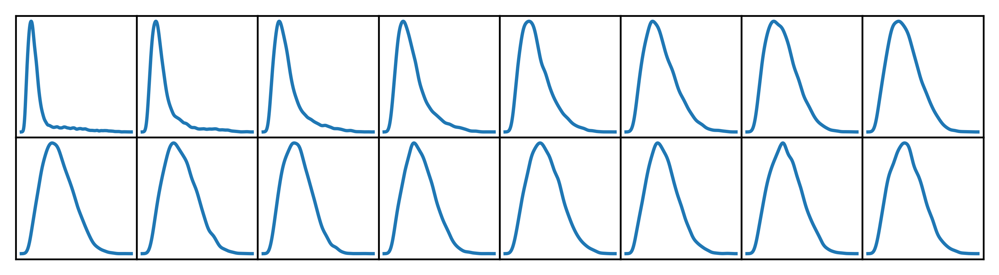

In [22]:

fig, axs = plt.subplots(2, 8, dpi = 480, figsize = (6.8,2))
fig.subplots_adjust(left=0, wspace=0, hspace=0)

ax1 = axs[0, 0]
kde1 = sm.nonparametric.KDEUnivariate(AllDat[str(0)])
kde1.fit()
ax1.set_xticks([]) 
ax1.set_yticks([])

ax2 = axs[0, 1]
kde2 = sm.nonparametric.KDEUnivariate(AllDat[str(1)])
kde2.fit()
ax2.set_xticks([]) 
ax2.set_yticks([])

ax3 = axs[0, 2]
kde3 = sm.nonparametric.KDEUnivariate(AllDat[str(2)])
kde3.fit()
ax3.set_xticks([]) 
ax3.set_yticks([])

ax4 = axs[0, 3]
kde4 = sm.nonparametric.KDEUnivariate(AllDat[str(3)])
kde4.fit()
ax4.set_xticks([]) 
ax4.set_yticks([])

ax5 = axs[0, 4]
kde5 = sm.nonparametric.KDEUnivariate(AllDat[str(4)])
kde5.fit()
ax5.set_xticks([]) 
ax5.set_yticks([])

ax6 = axs[0, 5]
kde6 = sm.nonparametric.KDEUnivariate(AllDat[str(5)])
kde6.fit()
ax6.set_xticks([]) 
ax6.set_yticks([])

ax7 = axs[0, 6]
kde7 = sm.nonparametric.KDEUnivariate(AllDat[str(6)])
kde7.fit()
ax7.set_xticks([]) 
ax7.set_yticks([])

ax8 = axs[0, 7]
kde8 = sm.nonparametric.KDEUnivariate(AllDat[str(7)])
kde8.fit()
ax8.set_xticks([]) 
ax8.set_yticks([])

ax9 = axs[1, 0]
kde9 = sm.nonparametric.KDEUnivariate(AllDat[str(8)])
kde9.fit()
ax9.set_xticks([]) 
ax9.set_yticks([])

ax10 = axs[1, 1]
kde10 = sm.nonparametric.KDEUnivariate(AllDat[str(9)])
kde10.fit()
ax10.set_xticks([]) 
ax10.set_yticks([])

ax11 = axs[1, 2]
kde11 = sm.nonparametric.KDEUnivariate(AllDat[str(10)])
kde11.fit()
ax11.set_xticks([]) 
ax11.set_yticks([])

ax12 = axs[1, 3]
kde12 = sm.nonparametric.KDEUnivariate(AllDat[str(11)])
kde12.fit()
ax12.set_xticks([]) 
ax12.set_yticks([])

ax13 = axs[1, 4]
kde13 = sm.nonparametric.KDEUnivariate(AllDat[str(12)])
kde13.fit()
ax13.set_xticks([]) 
ax13.set_yticks([])

ax14 = axs[1, 5]
kde14 = sm.nonparametric.KDEUnivariate(AllDat[str(13)])
kde14.fit()
ax14.set_xticks([]) 
ax14.set_yticks([])

ax15 = axs[1, 6]
kde15 = sm.nonparametric.KDEUnivariate(AllDat[str(14)])
kde15.fit()
ax15.set_xticks([]) 
ax15.set_yticks([])

ax16 = axs[1, 7]
kde16 = sm.nonparametric.KDEUnivariate(AllDat[str(15)])
kde16.fit()
ax16.set_xticks([]) 
ax16.set_yticks([])




ax1.plot(kde1.support, kde1.density)
ax2.plot(kde2.support, kde2.density)
ax3.plot(kde3.support, kde3.density)
ax4.plot(kde4.support, kde4.density)
ax5.plot(kde5.support, kde5.density)
ax6.plot(kde6.support, kde6.density)
ax7.plot(kde7.support, kde7.density)
ax8.plot(kde8.support, kde8.density)
ax9.plot(kde9.support, kde9.density)
ax10.plot(kde10.support, kde10.density)
ax11.plot(kde11.support, kde11.density)
ax12.plot(kde12.support, kde12.density)
ax13.plot(kde13.support, kde13.density)
ax14.plot(kde14.support, kde14.density)
ax15.plot(kde15.support, kde15.density)
ax16.plot(kde16.support, kde16.density)


plt.show()


fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/KDE.png', bbox_inches='tight', pad_inches=0)

# Experiment 2
Eppendorf full of water (short)

## Extract Masks

In [23]:
patM = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing'

MS = np.asarray(Image.open(patM+'/MaskScaffold_2.png'))/255
ME = np.asarray(Image.open(patM+'/MaskEppen_2.png'))/255
MB = np.asarray(Image.open(patM+'/MaskBack_2.png'))/255


In [24]:
MA = np.asarray(Image.open(patM+'/MaskAll_2.png'))/255


### Extract Data

In [4]:
# pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/Fulleppendorf'
# # fol = '12'
# ScaffDat = dict()
# EppenDat = dict()
# BackgDat = dict()

# for k in range(0,26):
#     try:
#         fol = str(list(range(38, 59))[k])
#         ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm').pixel_array

#         ScaffDat[str(k)] = [(ds*MS)[i,j] for i in range(0,np.shape(MS)[0]) for j in range(0,np.shape(MS)[1]) if (ds*MS)[i,j] != 0]
#         EppenDat[str(k)] = [(ds*ME)[i,j] for i in range(0,np.shape(ME)[0]) for j in range(0,np.shape(ME)[1]) if (ds*ME)[i,j] != 0]
#         BackgDat[str(k)] = [(ds*MB)[i,j] for i in range(0,np.shape(MB)[0]) for j in range(0,np.shape(MB)[1]) if (ds*MB)[i,j] != 0]
#     except:
#         ScaffDat[str(k)] = []
#         EppenDat[str(k)] = []
#         BackgDat[str(k)] = []

In [5]:
# AllDat = dict()
# for k in range(0,26):
#     try:
#         fol = str(list(range(38, 59))[k])
#         ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm').pixel_array

#         AllDat[str(k)] = [(ds*MA)[i,j] for i in range(0,np.shape(MA)[0]) for j in range(0,np.shape(MA)[1]) if (ds*MA)[i,j] != 0]
#     except:
#         AllDat[str(k)] = []

In [25]:
exper = '2'

pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/Fulleppendorf'
# fol = '12'
ScaffDat = dict()
EppenDat = dict()
BackgDat = dict()
AllDat = dict()

if os.path.exists(pat+'/tmpDat') == False:
    os.mkdir(pat+'/tmpDat')


if os.path.exists(pat+'/tmpDat/ScaffDat'+exper+'.csv'):
    df2 = pd.read_csv(pat+'/tmpDat/ScaffDat'+exper+'.csv')
    ScaffDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/EppenDat'+exper+'.csv')
    EppenDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/BackgDat'+exper+'.csv')
    BackgDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/AllDat'+exper+'.csv')
    AllDat=df2.to_dict(orient='list')

else:
    for k in range(0,26):
        
        try:
            fol = str(list(range(38, 59))[k])
            ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')
            
            ScaffDat[str(k)] = [(ds*MS)[i,j] for i in range(0,np.shape(MS)[0]) for j in range(0,np.shape(MS)[1]) if (ds*MS)[i,j] != 0]
            EppenDat[str(k)] = [(ds*ME)[i,j] for i in range(0,np.shape(ME)[0]) for j in range(0,np.shape(ME)[1]) if (ds*ME)[i,j] != 0]
            BackgDat[str(k)] = [(ds*MB)[i,j] for i in range(0,np.shape(MB)[0]) for j in range(0,np.shape(MB)[1]) if (ds*MB)[i,j] != 0]
            AllDat[str(k)] = [(ds*MA)[i,j] for i in range(0,np.shape(MA)[0]) for j in range(0,np.shape(MA)[1]) if (ds*MA)[i,j] != 0]
        except:
            
            ScaffDat[str(k)] = np.nan*np.zeros(len([(MS)[i,j] for i in range(0,np.shape(MS)[0]) for j in range(0,np.shape(MS)[1]) if (MS)[i,j] != 0]))
            EppenDat[str(k)] = np.nan*np.zeros(len([(ME)[i,j] for i in range(0,np.shape(ME)[0]) for j in range(0,np.shape(ME)[1]) if (ME)[i,j] != 0]))
            BackgDat[str(k)] = np.nan*np.zeros(len([(MB)[i,j] for i in range(0,np.shape(MB)[0]) for j in range(0,np.shape(MB)[1]) if (MB)[i,j] != 0]))
            AllDat[str(k)] = np.nan*np.zeros(len([(MA)[i,j] for i in range(0,np.shape(MA)[0]) for j in range(0,np.shape(MA)[1]) if (MA)[i,j] != 0]))

    df = pd.DataFrame.from_dict(AllDat)
    df.to_csv(pat+'/tmpDat/ScaffDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(AllDat)
    df.to_csv(pat+'/tmpDat/EppenDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(AllDat)
    df.to_csv(pat+'/tmpDat/BackgDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(AllDat)
    df.to_csv(pat+'/tmpDat/AllDat'+exper+'.csv', index=False)

### Plot Data

In [26]:
SDM = [np.mean(ScaffDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 26)]
SDS = [np.std(ScaffDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 26)]

SDP = len(ScaffDat[str(0)])


In [27]:
EDM = [np.mean(EppenDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 26)]
EDS = [np.std(EppenDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 26)]

EDP = len(EppenDat[str(k)])

EDP

11900

In [28]:
FDM = [np.mean(AllDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 26)]
FDS = [np.std(AllDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 26)]

In [29]:
tp = list(range(0,26))


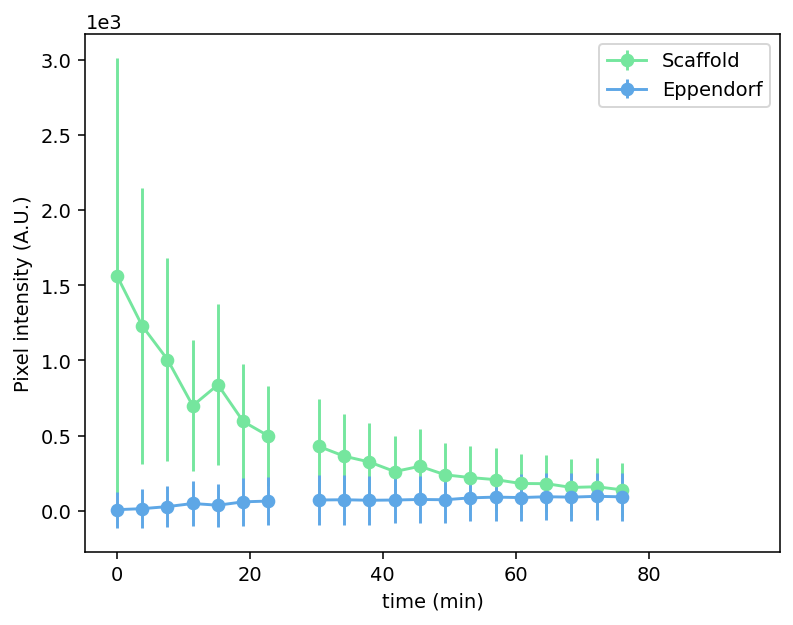

In [30]:
k = 0

plt.figure(dpi=140)

plt.errorbar([tp[i]*3.8 for i in range(0, len(tp))], SDM, yerr=SDS, fmt='-o', label='Scaffold', color='#75E69E')
plt.errorbar([tp[i]*3.8 for i in range(0, len(tp))], EDM, yerr=EDS, fmt='-o', label='Eppendorf', color='#5EA7E6')

plt.xlabel('time (min)')
plt.ylabel('Pixel intensity (A.U.)')

plt.legend()
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))


plt.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/DatErr2.svg')

plt.show()

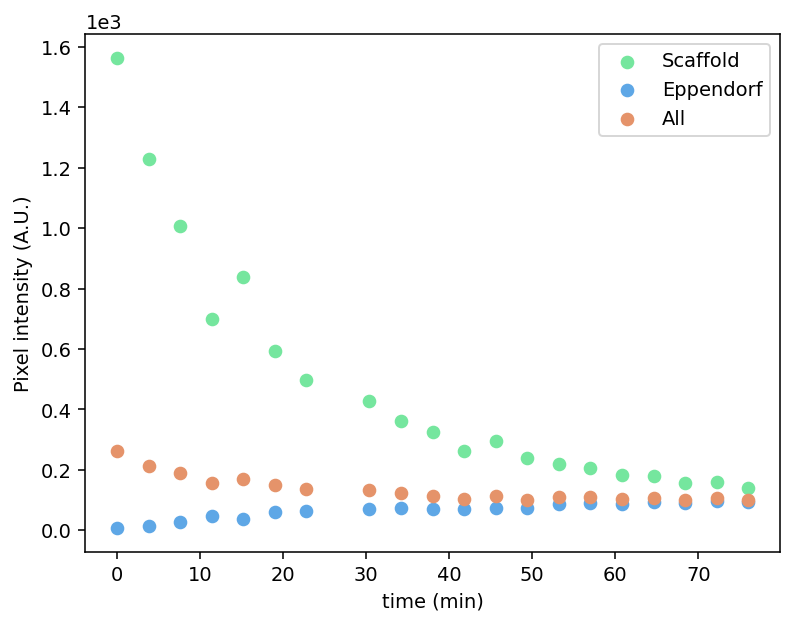

In [31]:
k = 0

plt.figure(dpi=140)

plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], SDM,  label='Scaffold', color='#75E69E')
plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], EDM,   label='Eppendorf', color='#5EA7E6')
plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], FDM,   label='All', color='#E5936A')
# plt.scatter(tp, [FDMb[i]*10 for i in range(0,len(FDMb))],   label='All')

plt.xlabel('time (min)')
plt.ylabel('Pixel intensity (A.U.)')

plt.legend()
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

plt.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/DatAll2.svg')

plt.show()

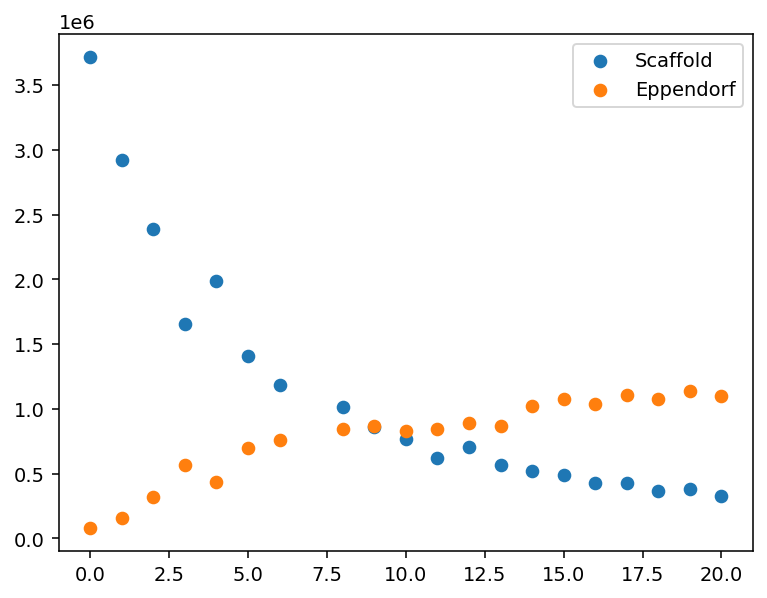

In [32]:
plt.figure(dpi=140)

plt.scatter(tp, [SDM[k]*SDP for k in range(0,26)],  label='Scaffold')
plt.scatter(tp, [EDM[k]*EDP for k in range(0,26)],   label='Eppendorf')
# plt.scatter(tp, FDM,   label='All')

plt.legend()
plt.show()

In [38]:
pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/Fulleppendorf'
# fol = '12.'
Imagedict = dict()


for k in range(0,26):
    try:
        fol = str(list(range(38, 58))[k])
        Imagedict[str(k)] = dicom.dcmread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm').pixel_array
    except:
        Imagedict[str(k)] = []



In [39]:
Imagedict['1']

array([[4865, 1400, 1019, ..., 2066,  835, 3612],
       [3703, 2867, 3333, ..., 1860,  932, 3298],
       [3348, 2050,  715, ..., 2375, 4294, 2838],
       ...,
       [2176, 2369,  767, ..., 2163, 1797, 1780],
       [2790, 3824, 1623, ...,  696, 1616,  367],
       [1659,  670, 3120, ..., 1622, 2164, 3161]], dtype=int16)

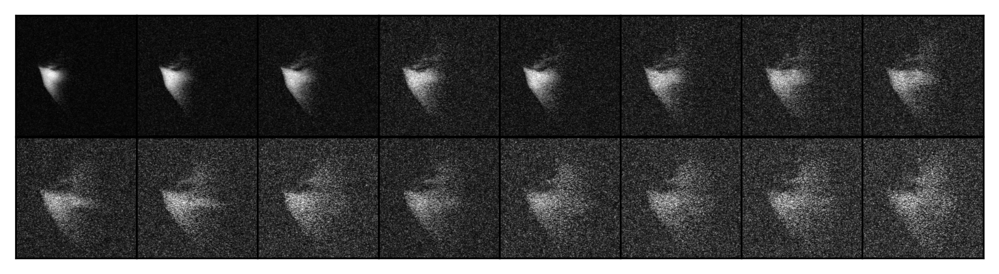

In [41]:

fig, axs = plt.subplots(2, 8, dpi = 480, figsize = (6.8,2))
fig.subplots_adjust(left=0, wspace=0, hspace=0)

ax1 = axs[0, 0]
ds1 = Imagedict['0']
ax1.set_xticks([]) 
ax1.set_yticks([])

ax2 = axs[0, 1]
ds2 = Imagedict['1']
ax2.set_xticks([]) 
ax2.set_yticks([])

ax3 = axs[0, 2]
ds3 = Imagedict['2']
ax3.set_xticks([]) 
ax3.set_yticks([])

ax4 = axs[0, 3]
ds4 = Imagedict['3']
ax4.set_xticks([]) 
ax4.set_yticks([])

ax5 = axs[0, 4]
ds5= Imagedict['4']
ax5.set_xticks([]) 
ax5.set_yticks([])

ax6 = axs[0, 5]
ds6 = Imagedict['5']
ax6.set_xticks([]) 
ax6.set_yticks([])

ax7 = axs[0, 6]
ds7 = Imagedict['6']
ax7.set_xticks([]) 
ax7.set_yticks([])

ax8 = axs[0, 7]
ds8 = Imagedict['8']
ax8.set_xticks([]) 
ax8.set_yticks([])

ax9 = axs[1, 0]
ds9 = Imagedict['9']
ax9.set_xticks([]) 
ax9.set_yticks([])

ax10 = axs[1, 1]
ds10 = Imagedict['10']
ax10.set_xticks([]) 
ax10.set_yticks([])

ax11 = axs[1, 2]
ds11 = Imagedict['11']
ax11.set_xticks([]) 
ax11.set_yticks([])

ax12 = axs[1, 3]
ds12 = Imagedict['12']
ax12.set_xticks([]) 
ax12.set_yticks([])

ax13 = axs[1, 4]
ds13= Imagedict['13']
ax13.set_xticks([]) 
ax13.set_yticks([])

ax14 = axs[1, 5]
ds14 = Imagedict['14']
ax14.set_xticks([]) 
ax14.set_yticks([])

ax15 = axs[1, 6]
ds15 = Imagedict['15']
ax15.set_xticks([]) 
ax15.set_yticks([])

ax16 = axs[1, 7]
ds16 = Imagedict['16']
ax16.set_xticks([]) 
ax16.set_yticks([])




ax1.imshow(ds1, cmap='gray')
ax2.imshow(ds2, cmap='gray')
ax3.imshow(ds3, cmap='gray')
ax4.imshow(ds4, cmap='gray')
ax5.imshow(ds5, cmap='gray')
ax6.imshow(ds6, cmap='gray')
ax7.imshow(ds7, cmap='gray')
ax8.imshow(ds8, cmap='gray')
ax9.imshow(ds9, cmap='gray')
ax10.imshow(ds10, cmap='gray')
ax11.imshow(ds11, cmap='gray')
ax12.imshow(ds12, cmap='gray')
ax13.imshow(ds13, cmap='gray')
ax14.imshow(ds14, cmap='gray')
ax15.imshow(ds15, cmap='gray')
ax16.imshow(ds16, cmap='gray')


plt.show()


fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/MRI_2.png', bbox_inches='tight', pad_inches=0)

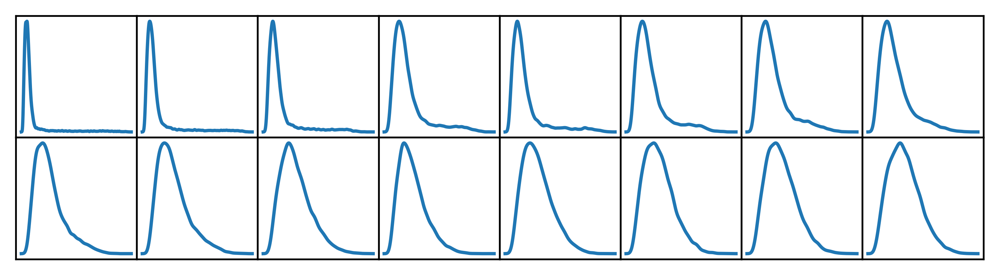

In [42]:

fig, axs = plt.subplots(2, 8, dpi = 480, figsize = (6.8,2))
fig.subplots_adjust(left=0, wspace=0, hspace=0)

ax1 = axs[0, 0]
kde1 = sm.nonparametric.KDEUnivariate(AllDat[str(0)])
kde1.fit()
ax1.set_xticks([]) 
ax1.set_yticks([])

ax2 = axs[0, 1]
kde2 = sm.nonparametric.KDEUnivariate(AllDat[str(1)])
kde2.fit()
ax2.set_xticks([]) 
ax2.set_yticks([])

ax3 = axs[0, 2]
kde3 = sm.nonparametric.KDEUnivariate(AllDat[str(2)])
kde3.fit()
ax3.set_xticks([]) 
ax3.set_yticks([])

ax4 = axs[0, 3]
kde4 = sm.nonparametric.KDEUnivariate(AllDat[str(3)])
kde4.fit()
ax4.set_xticks([]) 
ax4.set_yticks([])

ax5 = axs[0, 4]
kde5 = sm.nonparametric.KDEUnivariate(AllDat[str(4)])
kde5.fit()
ax5.set_xticks([]) 
ax5.set_yticks([])

ax6 = axs[0, 5]
kde6 = sm.nonparametric.KDEUnivariate(AllDat[str(5)])
kde6.fit()
ax6.set_xticks([]) 
ax6.set_yticks([])

ax7 = axs[0, 6]
kde7 = sm.nonparametric.KDEUnivariate(AllDat[str(6)])
kde7.fit()
ax7.set_xticks([]) 
ax7.set_yticks([])

ax8 = axs[0, 7]
kde8 = sm.nonparametric.KDEUnivariate(AllDat[str(8)])
kde8.fit()
ax8.set_xticks([]) 
ax8.set_yticks([])

ax9 = axs[1, 0]
kde9 = sm.nonparametric.KDEUnivariate(AllDat[str(9)])
kde9.fit()
ax9.set_xticks([]) 
ax9.set_yticks([])

ax10 = axs[1, 1]
kde10 = sm.nonparametric.KDEUnivariate(AllDat[str(10)])
kde10.fit()
ax10.set_xticks([]) 
ax10.set_yticks([])

ax11 = axs[1, 2]
kde11 = sm.nonparametric.KDEUnivariate(AllDat[str(11)])
kde11.fit()
ax11.set_xticks([]) 
ax11.set_yticks([])

ax12 = axs[1, 3]
kde12 = sm.nonparametric.KDEUnivariate(AllDat[str(12)])
kde12.fit()
ax12.set_xticks([]) 
ax12.set_yticks([])

ax13 = axs[1, 4]
kde13 = sm.nonparametric.KDEUnivariate(AllDat[str(13)])
kde13.fit()
ax13.set_xticks([]) 
ax13.set_yticks([])

ax14 = axs[1, 5]
kde14 = sm.nonparametric.KDEUnivariate(AllDat[str(14)])
kde14.fit()
ax14.set_xticks([]) 
ax14.set_yticks([])

ax15 = axs[1, 6]
kde15 = sm.nonparametric.KDEUnivariate(AllDat[str(15)])
kde15.fit()
ax15.set_xticks([]) 
ax15.set_yticks([])

ax16 = axs[1, 7]
kde16 = sm.nonparametric.KDEUnivariate(AllDat[str(16)])
kde16.fit()
ax16.set_xticks([]) 
ax16.set_yticks([])




ax1.plot(kde1.support, kde1.density)
ax2.plot(kde2.support, kde2.density)
ax3.plot(kde3.support, kde3.density)
ax4.plot(kde4.support, kde4.density)
ax5.plot(kde5.support, kde5.density)
ax6.plot(kde6.support, kde6.density)
ax7.plot(kde7.support, kde7.density)
ax8.plot(kde8.support, kde8.density)
ax9.plot(kde9.support, kde9.density)
ax10.plot(kde10.support, kde10.density)
ax11.plot(kde11.support, kde11.density)
ax12.plot(kde12.support, kde12.density)
ax13.plot(kde13.support, kde13.density)
ax14.plot(kde14.support, kde14.density)
ax15.plot(kde15.support, kde15.density)
ax16.plot(kde16.support, kde16.density)


plt.show()


fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/KDE_2.png', bbox_inches='tight', pad_inches=0)

# EXPERIMENT 3
Eppendorf full of water (overnight)

## Extract Masks

In [43]:
patM = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing'

MS = np.asarray(Image.open(patM+'/MaskScaffold_3.png'))/255
ME = np.asarray(Image.open(patM+'/MaskEppen_3.png'))/255
MB = np.asarray(Image.open(patM+'/MaskBack_3.png'))/255


In [44]:
MA = np.asarray(Image.open(patM+'/MaskAll_3.png'))/255


In [45]:
pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/DifussionEppendorf'
fol = '12'

ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

# ds.astype(np.int64) 

ds


Array([[259.66916 , 171.39432 , 241.03738 , ..., 114.50407 , 103.56015 ,
        236.15332 ],
       [358.9784  , 289.60666 , 102.022575, ..., 180.25798 , 126.17154 ,
        246.73546 ],
       [ 89.26975 , 161.26442 , 328.046   , ..., 331.75427 , 178.35863 ,
         20.259804],
       ...,
       [ 71.99466 , 111.15758 , 181.16243 , ..., 316.83075 , 248.9966  ,
        266.63348 ],
       [147.5167  ,  87.822624,  89.81243 , ...,  27.766783, 272.60287 ,
        254.51378 ],
       [222.76738 , 186.58917 , 190.56877 , ..., 186.40828 ,  90.89777 ,
        187.49362 ]], dtype=float32)

### Extract Data

In [46]:
# pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/DiffusionEppenON'
# # fol = '12'
# ScaffDat = dict()
# EppenDat = dict()
# BackgDat = dict()

# for k in range(0,46):
#     fol = str(list(range(59, 105))[k])
#     ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

#     ScaffDat[str(k)] = [(ds*MS)[i,j] for i in range(0,np.shape(MS)[0]) for j in range(0,np.shape(MS)[1]) if (ds*MS)[i,j] != 0]
#     EppenDat[str(k)] = [(ds*ME)[i,j] for i in range(0,np.shape(ME)[0]) for j in range(0,np.shape(ME)[1]) if (ds*ME)[i,j] != 0]
#     BackgDat[str(k)] = [(ds*MB)[i,j] for i in range(0,np.shape(MB)[0]) for j in range(0,np.shape(MB)[1]) if (ds*MB)[i,j] != 0]

In [47]:
# AllDat = dict()
# for k in range(0,46):
#     fol = str(list(range(59, 105))[k])
#     ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

#     AllDat[str(k)] = [(ds*MA)[i,j] for i in range(0,np.shape(MA)[0]) for j in range(0,np.shape(MA)[1]) if (ds*MA)[i,j] != 0]

In [48]:
exper = '3'

pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/DiffusionEppenON'
# fol = '12'
ScaffDat = dict()
EppenDat = dict()
BackgDat = dict()
AllDat = dict()

if os.path.exists(pat+'/tmpDat') == False:
    os.mkdir(pat+'/tmpDat')


if os.path.exists(pat+'/tmpDat/ScaffDat'+exper+'.csv'):
    df2 = pd.read_csv(pat+'/tmpDat/ScaffDat'+exper+'.csv')
    ScaffDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/EppenDat'+exper+'.csv')
    EppenDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/BackgDat'+exper+'.csv')
    BackgDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/AllDat'+exper+'.csv')
    AllDat=df2.to_dict(orient='list')

else:
    for k in range(0,46):
        fol = str(list(range(59, 105))[k])
        ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

        ScaffDat[str(k)] = [(ds*MS)[i,j] for i in range(0,np.shape(MS)[0]) for j in range(0,np.shape(MS)[1]) if (ds*MS)[i,j] != 0]
        EppenDat[str(k)] = [(ds*ME)[i,j] for i in range(0,np.shape(ME)[0]) for j in range(0,np.shape(ME)[1]) if (ds*ME)[i,j] != 0]
        BackgDat[str(k)] = [(ds*MB)[i,j] for i in range(0,np.shape(MB)[0]) for j in range(0,np.shape(MB)[1]) if (ds*MB)[i,j] != 0]
        AllDat[str(k)] = [(ds*MA)[i,j] for i in range(0,np.shape(MA)[0]) for j in range(0,np.shape(MA)[1]) if (ds*MA)[i,j] != 0]

    df = pd.DataFrame.from_dict(ScaffDat)
    df.to_csv(pat+'/tmpDat/ScaffDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(EppenDat)
    df.to_csv(pat+'/tmpDat/EppenDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(BackgDat)
    df.to_csv(pat+'/tmpDat/BackgDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(AllDat)
    df.to_csv(pat+'/tmpDat/AllDat'+exper+'.csv', index=False)

In [49]:
AllImg = dict()
for k in range(0,46):
    fol = str(list(range(59, 105))[k])
    ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

    AllImg[str(k)] = [(ds)[i,j] for i in range(0,np.shape(MA)[0]) for j in range(0,np.shape(MA)[1]) if (ds)[i,j] != 0]

In [50]:
kde1 = sm.nonparametric.KDEUnivariate(AllDat[str(0)])
kde1.fit()

258.5717
210.59904


(array([3.5375e+04, 9.0100e+02, 1.9400e+02, 1.2200e+02, 7.6000e+01,
        5.1000e+01, 5.1000e+01, 4.0000e+01, 3.8000e+01, 1.6000e+01]),
 array([1.09199500e+00, 5.12130066e+02, 1.02316815e+03, 1.53420618e+03,
        2.04524426e+03, 2.55628223e+03, 3.06732031e+03, 3.57835840e+03,
        4.08939648e+03, 4.60043457e+03, 5.11147266e+03]),
 <BarContainer object of 10 artists>)

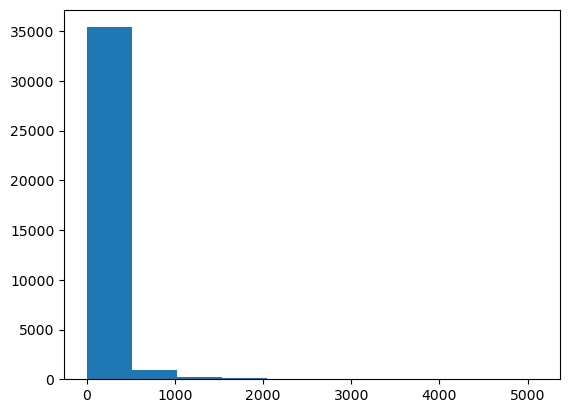

In [51]:
print(np.mean(AllImg['0']))
print(np.median(AllImg['0']))
plt.hist(AllImg['0'])


236.1611
216.52083


(array([6.3420e+03, 1.2809e+04, 1.0153e+04, 4.9580e+03, 1.7300e+03,
        5.9500e+02, 2.0000e+02, 6.0000e+01, 1.1000e+01, 6.0000e+00]),
 array([   1.89352179,  112.49547577,  223.09742737,  333.69940186,
         444.30136108,  554.90332031,  665.50524902,  776.10723877,
         886.70916748,  997.31115723, 1107.91308594]),
 <BarContainer object of 10 artists>)

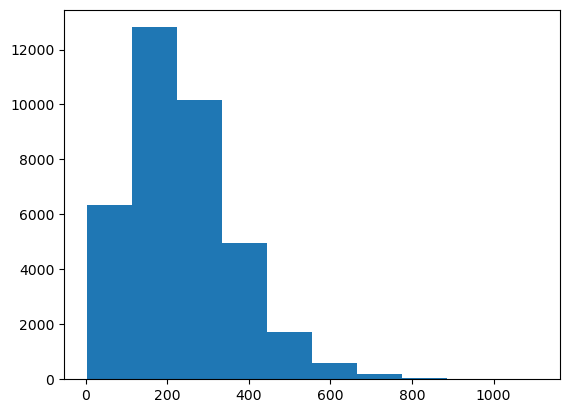

In [52]:
print(np.mean(AllImg['6']))
print(np.median(AllImg['6']))

plt.hist(AllImg['6'])

### Plot Data

In [53]:
SDM = [np.mean(ScaffDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 46)]
SDS = [np.std(ScaffDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 46)]

In [54]:
EDM = [np.mean(EppenDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 46)]
EDS = [np.std(EppenDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 46)]

In [55]:
FDM = [np.mean(AllDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 46)]
FDS = [np.std(AllDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 46)]

In [56]:
FDMb = [np.mean(AllImg[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 46)]
FDSb = [np.std(AllImg[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 46)]

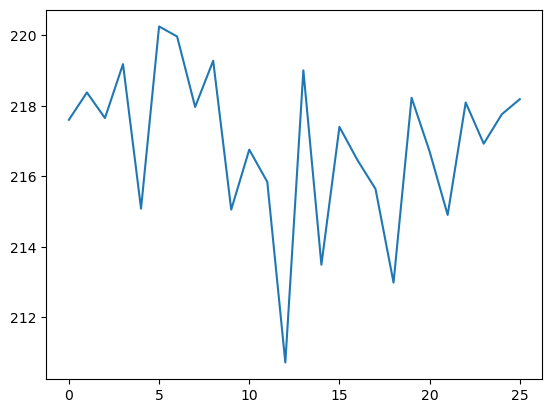

In [57]:
plt.plot([np.mean(BackgDat[str(k)])  for k in range(0, 26)])

(array([1., 0., 2., 0., 3., 2., 4., 8., 4., 2.]),
 array([210.72344115, 211.67643952, 212.62943789, 213.58243626,
        214.53543463, 215.488433  , 216.44143136, 217.39442973,
        218.3474281 , 219.30042647, 220.25342484]),
 <BarContainer object of 10 artists>)

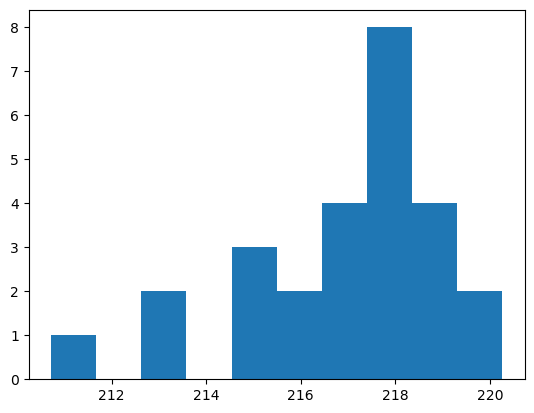

In [58]:
plt.hist([np.mean(BackgDat[str(k)])  for k in range(0, 26)])

In [59]:
tp = list(range(0,46))
len(SDM)

46

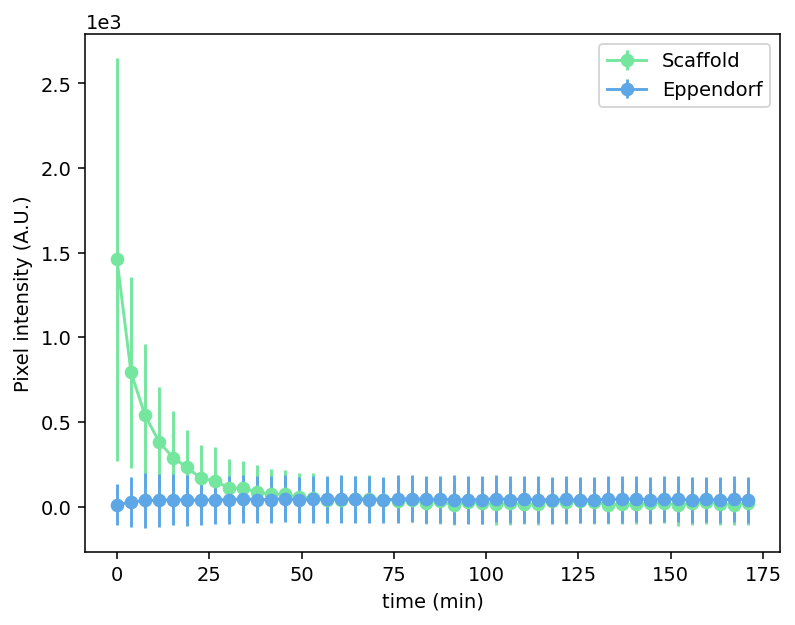

In [60]:
k = 0

plt.figure(dpi=140)

plt.errorbar([tp[i]*3.8 for i in range(0, len(tp))], SDM, yerr=SDS, fmt='-o', label='Scaffold', color='#75E69E')
plt.errorbar([tp[i]*3.8 for i in range(0, len(tp))], EDM, yerr=EDS, fmt='-o', label='Eppendorf', color='#5EA7E6')

plt.xlabel('time (min)')
plt.ylabel('Pixel intensity (A.U.)')

plt.legend()
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))


plt.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/DatErr3.svg')

plt.show()

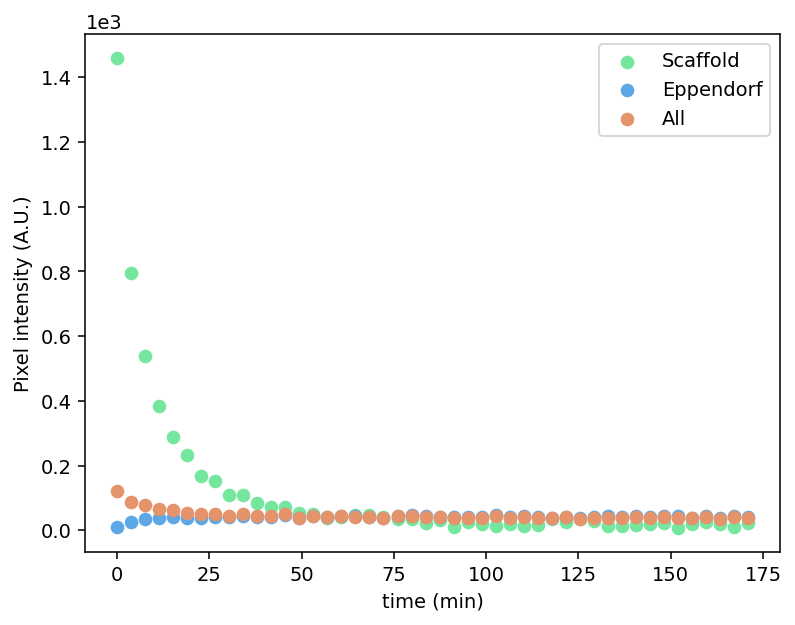

In [61]:
k = 0

plt.figure(dpi=140)

plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], SDM,  label='Scaffold', color='#75E69E')
plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], EDM,   label='Eppendorf', color='#5EA7E6')
plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], FDM,   label='All', color='#E5936A')
# plt.scatter(tp, [FDMb[i]*10 for i in range(0,len(FDMb))],   label='All')

plt.xlabel('time (min)')
plt.ylabel('Pixel intensity (A.U.)')

plt.legend()
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

plt.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/DatAll3.svg')


plt.show()

In [62]:
pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/DiffusionEppenON'
# fol = '12.'
Imagedict = dict()


for k in range(0,46):
    fol = str(list(range(59, 105))[k])
    Imagedict[str(k)] = dicom.dcmread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm').pixel_array



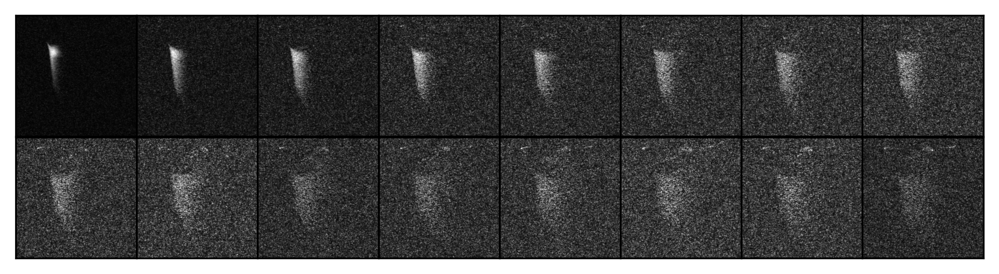

In [63]:

fig, axs = plt.subplots(2, 8, dpi = 480, figsize = (6.8,2))
fig.subplots_adjust(left=0, wspace=0, hspace=0)

ax1 = axs[0, 0]
ds1 = Imagedict['0']
ax1.set_xticks([]) 
ax1.set_yticks([])

ax2 = axs[0, 1]
ds2 = Imagedict['1']
ax2.set_xticks([]) 
ax2.set_yticks([])

ax3 = axs[0, 2]
ds3 = Imagedict['2']
ax3.set_xticks([]) 
ax3.set_yticks([])

ax4 = axs[0, 3]
ds4 = Imagedict['3']
ax4.set_xticks([]) 
ax4.set_yticks([])

ax5 = axs[0, 4]
ds5= Imagedict['4']
ax5.set_xticks([]) 
ax5.set_yticks([])

ax6 = axs[0, 5]
ds6 = Imagedict['5']
ax6.set_xticks([]) 
ax6.set_yticks([])

ax7 = axs[0, 6]
ds7 = Imagedict['6']
ax7.set_xticks([]) 
ax7.set_yticks([])

ax8 = axs[0, 7]
ds8 = Imagedict['7']
ax8.set_xticks([]) 
ax8.set_yticks([])

ax9 = axs[1, 0]
ds9 = Imagedict['8']
ax9.set_xticks([]) 
ax9.set_yticks([])

ax10 = axs[1, 1]
ds10 = Imagedict['9']
ax10.set_xticks([]) 
ax10.set_yticks([])

ax11 = axs[1, 2]
ds11 = Imagedict['10']
ax11.set_xticks([]) 
ax11.set_yticks([])

ax12 = axs[1, 3]
ds12 = Imagedict['11']
ax12.set_xticks([]) 
ax12.set_yticks([])

ax13 = axs[1, 4]
ds13= Imagedict['12']
ax13.set_xticks([]) 
ax13.set_yticks([])

ax14 = axs[1, 5]
ds14 = Imagedict['13']
ax14.set_xticks([]) 
ax14.set_yticks([])

ax15 = axs[1, 6]
ds15 = Imagedict['14']
ax15.set_xticks([]) 
ax15.set_yticks([])

ax16 = axs[1, 7]
ds16 = Imagedict['15']
ax16.set_xticks([]) 
ax16.set_yticks([])




ax1.imshow(ds1, cmap='gray')
ax2.imshow(ds2, cmap='gray')
ax3.imshow(ds3, cmap='gray')
ax4.imshow(ds4, cmap='gray')
ax5.imshow(ds5, cmap='gray')
ax6.imshow(ds6, cmap='gray')
ax7.imshow(ds7, cmap='gray')
ax8.imshow(ds8, cmap='gray')
ax9.imshow(ds9, cmap='gray')
ax10.imshow(ds10, cmap='gray')
ax11.imshow(ds11, cmap='gray')
ax12.imshow(ds12, cmap='gray')
ax13.imshow(ds13, cmap='gray')
ax14.imshow(ds14, cmap='gray')
ax15.imshow(ds15, cmap='gray')
ax16.imshow(ds16, cmap='gray')


plt.show()


fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/MRI_3.png', bbox_inches='tight', pad_inches=0)

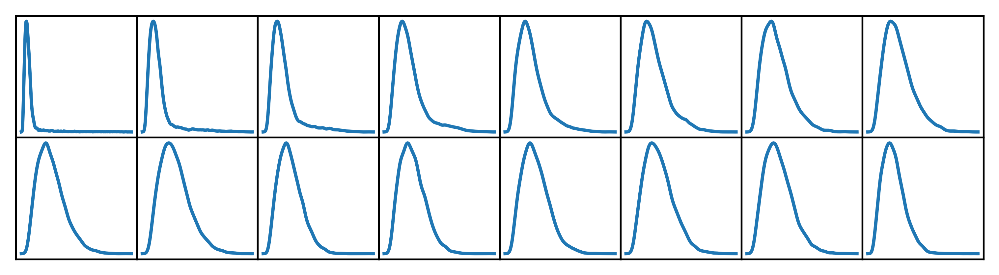

In [64]:

fig, axs = plt.subplots(2, 8, dpi = 480, figsize = (6.8,2))
fig.subplots_adjust(left=0, wspace=0, hspace=0)

ax1 = axs[0, 0]
kde1 = sm.nonparametric.KDEUnivariate(AllDat[str(0)])
kde1.fit()
ax1.set_xticks([]) 
ax1.set_yticks([])

ax2 = axs[0, 1]
kde2 = sm.nonparametric.KDEUnivariate(AllDat[str(1)])
kde2.fit()
ax2.set_xticks([]) 
ax2.set_yticks([])

ax3 = axs[0, 2]
kde3 = sm.nonparametric.KDEUnivariate(AllDat[str(2)])
kde3.fit()
ax3.set_xticks([]) 
ax3.set_yticks([])

ax4 = axs[0, 3]
kde4 = sm.nonparametric.KDEUnivariate(AllDat[str(3)])
kde4.fit()
ax4.set_xticks([]) 
ax4.set_yticks([])

ax5 = axs[0, 4]
kde5 = sm.nonparametric.KDEUnivariate(AllDat[str(4)])
kde5.fit()
ax5.set_xticks([]) 
ax5.set_yticks([])

ax6 = axs[0, 5]
kde6 = sm.nonparametric.KDEUnivariate(AllDat[str(5)])
kde6.fit()
ax6.set_xticks([]) 
ax6.set_yticks([])

ax7 = axs[0, 6]
kde7 = sm.nonparametric.KDEUnivariate(AllDat[str(6)])
kde7.fit()
ax7.set_xticks([]) 
ax7.set_yticks([])

ax8 = axs[0, 7]
kde8 = sm.nonparametric.KDEUnivariate(AllDat[str(7)])
kde8.fit()
ax8.set_xticks([]) 
ax8.set_yticks([])

ax9 = axs[1, 0]
kde9 = sm.nonparametric.KDEUnivariate(AllDat[str(8)])
kde9.fit()
ax9.set_xticks([]) 
ax9.set_yticks([])

ax10 = axs[1, 1]
kde10 = sm.nonparametric.KDEUnivariate(AllDat[str(9)])
kde10.fit()
ax10.set_xticks([]) 
ax10.set_yticks([])

ax11 = axs[1, 2]
kde11 = sm.nonparametric.KDEUnivariate(AllDat[str(10)])
kde11.fit()
ax11.set_xticks([]) 
ax11.set_yticks([])

ax12 = axs[1, 3]
kde12 = sm.nonparametric.KDEUnivariate(AllDat[str(11)])
kde12.fit()
ax12.set_xticks([]) 
ax12.set_yticks([])

ax13 = axs[1, 4]
kde13 = sm.nonparametric.KDEUnivariate(AllDat[str(12)])
kde13.fit()
ax13.set_xticks([]) 
ax13.set_yticks([])

ax14 = axs[1, 5]
kde14 = sm.nonparametric.KDEUnivariate(AllDat[str(13)])
kde14.fit()
ax14.set_xticks([]) 
ax14.set_yticks([])

ax15 = axs[1, 6]
kde15 = sm.nonparametric.KDEUnivariate(AllDat[str(14)])
kde15.fit()
ax15.set_xticks([]) 
ax15.set_yticks([])

ax16 = axs[1, 7]
kde16 = sm.nonparametric.KDEUnivariate(AllDat[str(15)])
kde16.fit()
ax16.set_xticks([]) 
ax16.set_yticks([])




ax1.plot(kde1.support, kde1.density)
ax2.plot(kde2.support, kde2.density)
ax3.plot(kde3.support, kde3.density)
ax4.plot(kde4.support, kde4.density)
ax5.plot(kde5.support, kde5.density)
ax6.plot(kde6.support, kde6.density)
ax7.plot(kde7.support, kde7.density)
ax8.plot(kde8.support, kde8.density)
ax9.plot(kde9.support, kde9.density)
ax10.plot(kde10.support, kde10.density)
ax11.plot(kde11.support, kde11.density)
ax12.plot(kde12.support, kde12.density)
ax13.plot(kde13.support, kde13.density)
ax14.plot(kde14.support, kde14.density)
ax15.plot(kde15.support, kde15.density)
ax16.plot(kde16.support, kde16.density)


plt.show()


fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/KDE_3a.png', bbox_inches='tight', pad_inches=0)

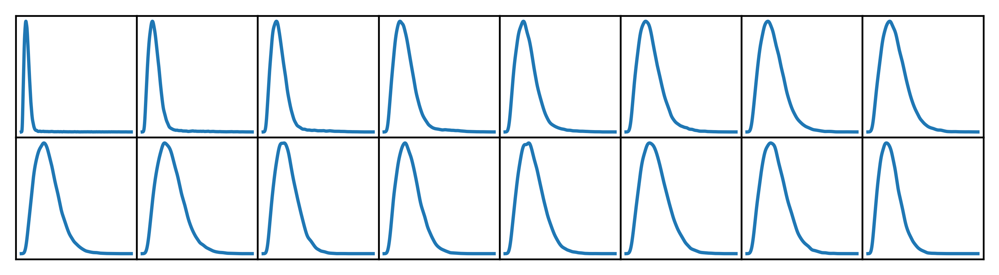

In [65]:

fig, axs = plt.subplots(2, 8, dpi = 480, figsize = (6.8,2))
fig.subplots_adjust(left=0, wspace=0, hspace=0)

ax1 = axs[0, 0]
kde1 = sm.nonparametric.KDEUnivariate(AllImg[str(0)])
kde1.fit()
ax1.set_xticks([]) 
ax1.set_yticks([])

ax2 = axs[0, 1]
kde2 = sm.nonparametric.KDEUnivariate(AllImg[str(1)])
kde2.fit()
ax2.set_xticks([]) 
ax2.set_yticks([])

ax3 = axs[0, 2]
kde3 = sm.nonparametric.KDEUnivariate(AllImg[str(2)])
kde3.fit()
ax3.set_xticks([]) 
ax3.set_yticks([])

ax4 = axs[0, 3]
kde4 = sm.nonparametric.KDEUnivariate(AllImg[str(3)])
kde4.fit()
ax4.set_xticks([]) 
ax4.set_yticks([])

ax5 = axs[0, 4]
kde5 = sm.nonparametric.KDEUnivariate(AllImg[str(4)])
kde5.fit()
ax5.set_xticks([]) 
ax5.set_yticks([])

ax6 = axs[0, 5]
kde6 = sm.nonparametric.KDEUnivariate(AllImg[str(5)])
kde6.fit()
ax6.set_xticks([]) 
ax6.set_yticks([])

ax7 = axs[0, 6]
kde7 = sm.nonparametric.KDEUnivariate(AllImg[str(6)])
kde7.fit()
ax7.set_xticks([]) 
ax7.set_yticks([])

ax8 = axs[0, 7]
kde8 = sm.nonparametric.KDEUnivariate(AllImg[str(7)])
kde8.fit()
ax8.set_xticks([]) 
ax8.set_yticks([])

ax9 = axs[1, 0]
kde9 = sm.nonparametric.KDEUnivariate(AllImg[str(8)])
kde9.fit()
ax9.set_xticks([]) 
ax9.set_yticks([])

ax10 = axs[1, 1]
kde10 = sm.nonparametric.KDEUnivariate(AllImg[str(9)])
kde10.fit()
ax10.set_xticks([]) 
ax10.set_yticks([])

ax11 = axs[1, 2]
kde11 = sm.nonparametric.KDEUnivariate(AllImg[str(10)])
kde11.fit()
ax11.set_xticks([]) 
ax11.set_yticks([])

ax12 = axs[1, 3]
kde12 = sm.nonparametric.KDEUnivariate(AllImg[str(11)])
kde12.fit()
ax12.set_xticks([]) 
ax12.set_yticks([])

ax13 = axs[1, 4]
kde13 = sm.nonparametric.KDEUnivariate(AllImg[str(12)])
kde13.fit()
ax13.set_xticks([]) 
ax13.set_yticks([])

ax14 = axs[1, 5]
kde14 = sm.nonparametric.KDEUnivariate(AllImg[str(13)])
kde14.fit()
ax14.set_xticks([]) 
ax14.set_yticks([])

ax15 = axs[1, 6]
kde15 = sm.nonparametric.KDEUnivariate(AllImg[str(14)])
kde15.fit()
ax15.set_xticks([]) 
ax15.set_yticks([])

ax16 = axs[1, 7]
kde16 = sm.nonparametric.KDEUnivariate(AllImg[str(15)])
kde16.fit()
ax16.set_xticks([]) 
ax16.set_yticks([])




ax1.plot(kde1.support, kde1.density)
ax2.plot(kde2.support, kde2.density)
ax3.plot(kde3.support, kde3.density)
ax4.plot(kde4.support, kde4.density)
ax5.plot(kde5.support, kde5.density)
ax6.plot(kde6.support, kde6.density)
ax7.plot(kde7.support, kde7.density)
ax8.plot(kde8.support, kde8.density)
ax9.plot(kde9.support, kde9.density)
ax10.plot(kde10.support, kde10.density)
ax11.plot(kde11.support, kde11.density)
ax12.plot(kde12.support, kde12.density)
ax13.plot(kde13.support, kde13.density)
ax14.plot(kde14.support, kde14.density)
ax15.plot(kde15.support, kde15.density)
ax16.plot(kde16.support, kde16.density)


plt.show()


fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/KDE_3b.png', bbox_inches='tight', pad_inches=0)

# EXPERIMENT 4
Eppendorf full of water (overnight)

## Extract Masks

In [66]:
patM = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing'

MS = np.asarray(Image.open(patM+'/MaskScaffold_4.png'))/255
ME = np.asarray(Image.open(patM+'/MaskEppen_4.png'))/255
MB = np.asarray(Image.open(patM+'/MaskBack_4.png'))/255


In [67]:
MA = np.asarray(Image.open(patM+'/MaskAll_4.png'))/255


In [68]:
pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/0_5mleppendorf'
fol = '160'

ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

# ds.astype(np.int64) 

ds


Array([[117.28905 , 187.04517 ,  44.75503 , ..., 327.0204  , 244.30074 ,
         30.71121 ],
       [130.56123 ,  80.86771 , 300.939   , ...,  70.37343 ,  54.632004,
        195.53319 ],
       [192.13797 , 158.80319 , 266.83258 , ...,  75.31191 , 200.31734 ,
        181.02638 ],
       ...,
       [208.95969 ,  43.36608 ,  80.86771 , ..., 161.1181  , 310.19867 ,
        357.88593 ],
       [125.00543 ,  89.04708 ,  48.150238, ..., 114.97413 , 230.87422 ,
        219.29965 ],
       [130.25256 , 254.02338 , 373.78168 , ..., 269.1475  , 333.8108  ,
        161.1181  ]], dtype=float32)

### Extract Data

In [69]:
# pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/0_5mleppendorf'
# # fol = '12'
# ScaffDat = dict()
# EppenDat = dict()
# BackgDat = dict()

# for k in range(0,42):
#     fol = str(list(range(160, 202))[k])
#     ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')
    
#     ScaffDat[str(k)] = [(ds*MS)[i,j] for i in range(0,np.shape(MS)[0]) for j in range(0,np.shape(MS)[1]) if (ds*MS)[i,j] != 0]
#     EppenDat[str(k)] = [(ds*ME)[i,j] for i in range(0,np.shape(ME)[0]) for j in range(0,np.shape(ME)[1]) if (ds*ME)[i,j] != 0]
#     BackgDat[str(k)] = [(ds*MB)[i,j] for i in range(0,np.shape(MB)[0]) for j in range(0,np.shape(MB)[1]) if (ds*MB)[i,j] != 0]

In [70]:
# AllDat = dict()
# for k in range(0,42):
#     fol = str(list(range(160, 202))[k])
#     ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

#     AllDat[str(k)] = [(ds*MA)[i,j] for i in range(0,np.shape(MA)[0]) for j in range(0,np.shape(MA)[1]) if (ds*MA)[i,j] != 0]

In [71]:
exper = '4'

pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/0_5mleppendorf'
# fol = '12'
ScaffDat = dict()
EppenDat = dict()
BackgDat = dict()
AllDat = dict()

if os.path.exists(pat+'/tmpDat') == False:
    os.mkdir(pat+'/tmpDat')


if os.path.exists(pat+'/tmpDat/ScaffDat'+exper+'.csv'):
    df2 = pd.read_csv(pat+'/tmpDat/ScaffDat'+exper+'.csv')
    ScaffDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/EppenDat'+exper+'.csv')
    EppenDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/BackgDat'+exper+'.csv')
    BackgDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/AllDat'+exper+'.csv')
    AllDat=df2.to_dict(orient='list')

else:
    for k in range(0,42):
        fol = str(list(range(160, 202))[k])
        ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

        ScaffDat[str(k)] = [(ds*MS)[i,j] for i in range(0,np.shape(MS)[0]) for j in range(0,np.shape(MS)[1]) if (ds*MS)[i,j] != 0]
        EppenDat[str(k)] = [(ds*ME)[i,j] for i in range(0,np.shape(ME)[0]) for j in range(0,np.shape(ME)[1]) if (ds*ME)[i,j] != 0]
        BackgDat[str(k)] = [(ds*MB)[i,j] for i in range(0,np.shape(MB)[0]) for j in range(0,np.shape(MB)[1]) if (ds*MB)[i,j] != 0]
        AllDat[str(k)] = [(ds*MA)[i,j] for i in range(0,np.shape(MA)[0]) for j in range(0,np.shape(MA)[1]) if (ds*MA)[i,j] != 0]

    df = pd.DataFrame.from_dict(ScaffDat)
    df.to_csv(pat+'/tmpDat/ScaffDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(EppenDat)
    df.to_csv(pat+'/tmpDat/EppenDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(BackgDat)
    df.to_csv(pat+'/tmpDat/BackgDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(AllDat)
    df.to_csv(pat+'/tmpDat/AllDat'+exper+'.csv', index=False)

In [72]:
AllImg = dict()
for k in range(0,42):
    fol = str(list(range(160, 202))[k])
    ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

    AllImg[str(k)] = [(ds)[i,j] for i in range(0,np.shape(MA)[0]) for j in range(0,np.shape(MA)[1]) if (ds)[i,j] != 0]

In [73]:
kde1 = sm.nonparametric.KDEUnivariate(AllDat[str(0)])
kde1.fit()

269.14783
214.66982


(array([3.5166e+04, 9.6600e+02, 2.3000e+02, 1.3300e+02, 8.8000e+01,
        1.1100e+02, 7.3000e+01, 5.8000e+01, 2.6000e+01, 1.3000e+01]),
 array([1.08029389e+00, 5.06642395e+02, 1.01220447e+03, 1.51776660e+03,
        2.02332861e+03, 2.52889062e+03, 3.03445288e+03, 3.54001489e+03,
        4.04557690e+03, 4.55113916e+03, 5.05670117e+03]),
 <BarContainer object of 10 artists>)

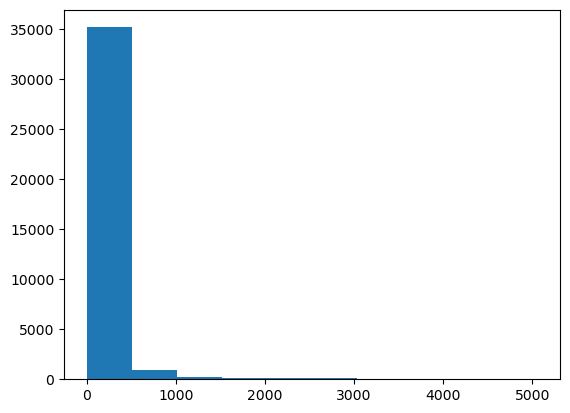

In [74]:
print(np.mean(AllImg['0']))
print(np.median(AllImg['0']))
plt.hist(AllImg['0'])


244.29088
218.79549


(array([7.8400e+03, 1.4703e+04, 9.0830e+03, 3.3070e+03, 1.0960e+03,
        4.5100e+02, 2.6000e+02, 8.8000e+01, 3.1000e+01, 5.0000e+00]),
 array([3.12397629e-01, 1.28231415e+02, 2.56150421e+02, 3.84069458e+02,
        5.11988464e+02, 6.39907471e+02, 7.67826477e+02, 8.95745483e+02,
        1.02366455e+03, 1.15158350e+03, 1.27950256e+03]),
 <BarContainer object of 10 artists>)

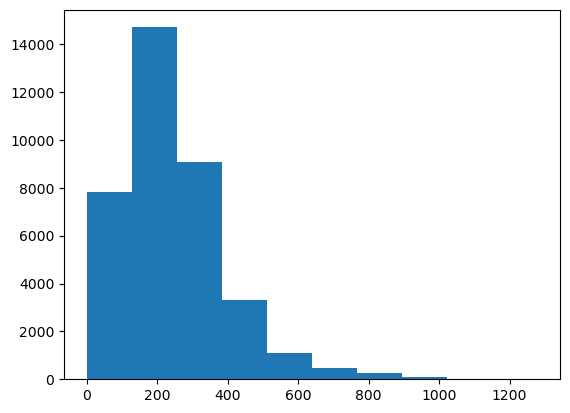

In [75]:
print(np.mean(AllImg['6']))
print(np.median(AllImg['6']))

plt.hist(AllImg['6'])

### Plot Data

In [76]:
SDM = [np.mean(ScaffDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 41)]
SDS = [np.std(ScaffDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 41)]

In [77]:
EDM = [np.mean(EppenDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 41)]
EDS = [np.std(EppenDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 41)]

In [78]:
FDM = [np.mean(AllDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 41)]
FDS = [np.std(AllDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 41)]

In [79]:
FDMb = [np.mean(AllImg[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 41)]
FDSb = [np.std(AllImg[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 41)]

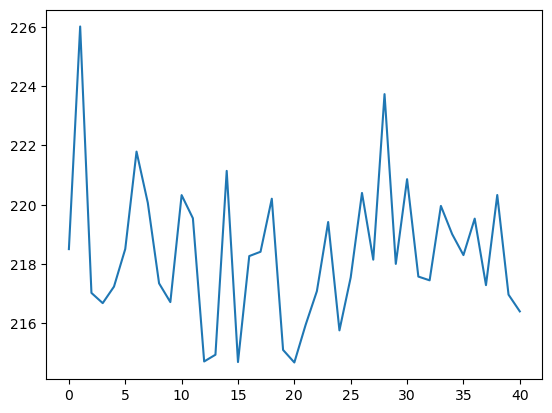

In [80]:
plt.plot([np.mean(BackgDat[str(k)])  for k in range(0, 41)])

(array([ 6.,  4., 10.,  7.,  8.,  3.,  1.,  1.,  0.,  1.]),
 array([214.67510612, 215.8091168 , 216.94312748, 218.07713817,
        219.21114885, 220.34515953, 221.47917021, 222.61318089,
        223.74719158, 224.88120226, 226.01521294]),
 <BarContainer object of 10 artists>)

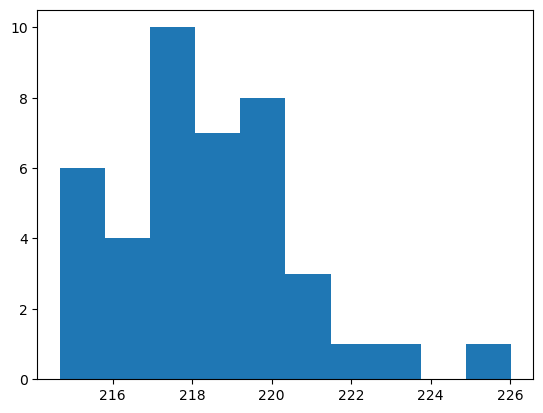

In [81]:
plt.hist([np.mean(BackgDat[str(k)])  for k in range(0, 41)])

In [82]:
tp = list(range(0,40))
len( ([SDM[0]] + SDM[2:]))

40

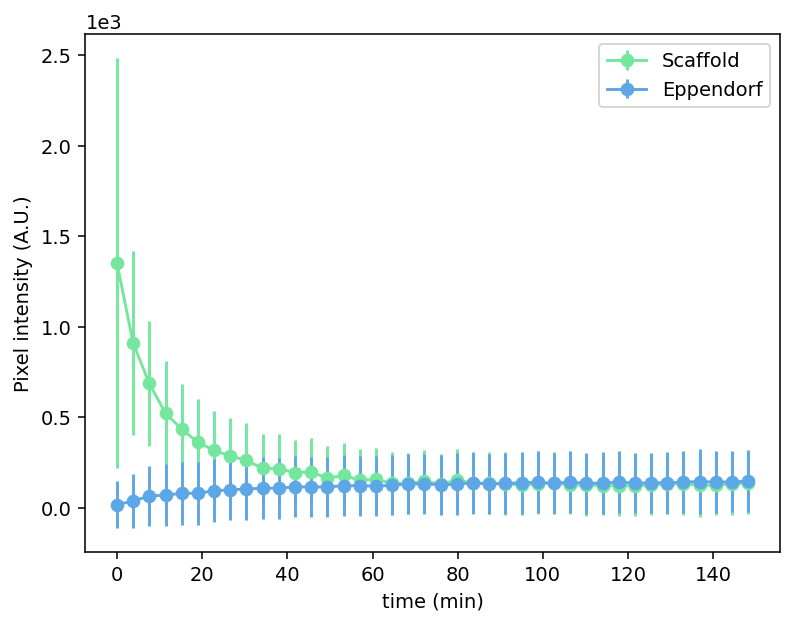

In [83]:
k = 0

plt.figure(dpi=140)

plt.errorbar([tp[i]*3.8 for i in range(0, len(tp))], ([SDM[0]] + SDM[2:]), yerr=([SDS[0]] + SDS[2:]), fmt='-o', label='Scaffold', color='#75E69E')
plt.errorbar([tp[i]*3.8 for i in range(0, len(tp))], ([EDM[0]] + EDM[2:]), yerr=([EDS[0]] + EDS[2:]), fmt='-o', label='Eppendorf', color='#5EA7E6')

plt.xlabel('time (min)')
plt.ylabel('Pixel intensity (A.U.)')

plt.legend()
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))


plt.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/DatErr4.svg')

plt.show()

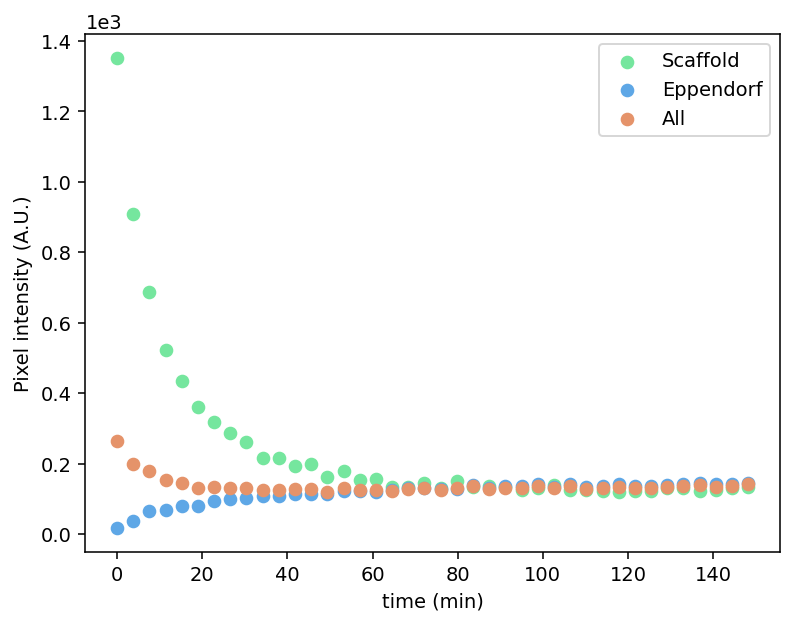

In [84]:
k = 0

plt.figure(dpi=140)

plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], ([SDM[0]] + SDM[2:]),  label='Scaffold', color='#75E69E')
plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], ([EDM[0]] + EDM[2:]),   label='Eppendorf', color='#5EA7E6')
plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], ([FDM[0]] + FDM[2:]),   label='All', color='#E5936A')
# plt.scatter(tp, [FDMb[i]*10 for i in range(0,len(FDMb))],   label='All')

plt.xlabel('time (min)')
plt.ylabel('Pixel intensity (A.U.)')

plt.legend()
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

plt.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/DatAll4.svg')


plt.show()

In [85]:
pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/0_5mleppendorf'
# fol = '12.'
Imagedict = dict()


for k in range(0,41):
    fol = str(list(range(160, 202))[k])
    Imagedict[str(k)] = dicom.dcmread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm').pixel_array



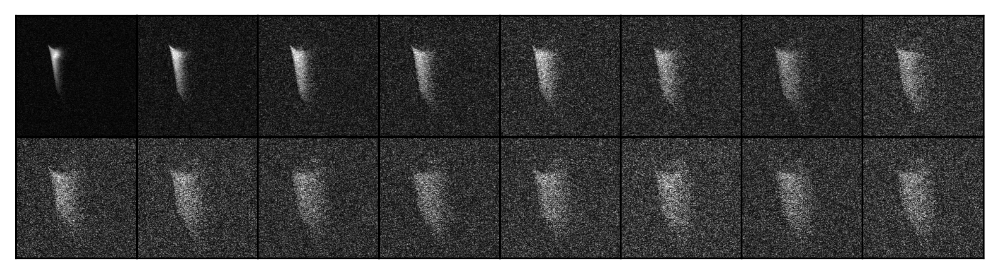

In [86]:

fig, axs = plt.subplots(2, 8, dpi = 480, figsize = (6.8,2))
fig.subplots_adjust(left=0, wspace=0, hspace=0)

ax1 = axs[0, 0]
ds1 = Imagedict['0']
ax1.set_xticks([]) 
ax1.set_yticks([])

ax2 = axs[0, 1]
ds2 = Imagedict['2']
ax2.set_xticks([]) 
ax2.set_yticks([])

ax3 = axs[0, 2]
ds3 = Imagedict['3']
ax3.set_xticks([]) 
ax3.set_yticks([])

ax4 = axs[0, 3]
ds4 = Imagedict['4']
ax4.set_xticks([]) 
ax4.set_yticks([])

ax5 = axs[0, 4]
ds5= Imagedict['5']
ax5.set_xticks([]) 
ax5.set_yticks([])

ax6 = axs[0, 5]
ds6 = Imagedict['6']
ax6.set_xticks([]) 
ax6.set_yticks([])

ax7 = axs[0, 6]
ds7 = Imagedict['7']
ax7.set_xticks([]) 
ax7.set_yticks([])

ax8 = axs[0, 7]
ds8 = Imagedict['8']
ax8.set_xticks([]) 
ax8.set_yticks([])

ax9 = axs[1, 0]
ds9 = Imagedict['9']
ax9.set_xticks([]) 
ax9.set_yticks([])

ax10 = axs[1, 1]
ds10 = Imagedict['10']
ax10.set_xticks([]) 
ax10.set_yticks([])

ax11 = axs[1, 2]
ds11 = Imagedict['11']
ax11.set_xticks([]) 
ax11.set_yticks([])

ax12 = axs[1, 3]
ds12 = Imagedict['12']
ax12.set_xticks([]) 
ax12.set_yticks([])

ax13 = axs[1, 4]
ds13= Imagedict['13']
ax13.set_xticks([]) 
ax13.set_yticks([])

ax14 = axs[1, 5]
ds14 = Imagedict['14']
ax14.set_xticks([]) 
ax14.set_yticks([])

ax15 = axs[1, 6]
ds15 = Imagedict['15']
ax15.set_xticks([]) 
ax15.set_yticks([])

ax16 = axs[1, 7]
ds16 = Imagedict['16']
ax16.set_xticks([]) 
ax16.set_yticks([])




ax1.imshow(ds1, cmap='gray')
ax2.imshow(ds2, cmap='gray')
ax3.imshow(ds3, cmap='gray')
ax4.imshow(ds4, cmap='gray')
ax5.imshow(ds5, cmap='gray')
ax6.imshow(ds6, cmap='gray')
ax7.imshow(ds7, cmap='gray')
ax8.imshow(ds8, cmap='gray')
ax9.imshow(ds9, cmap='gray')
ax10.imshow(ds10, cmap='gray')
ax11.imshow(ds11, cmap='gray')
ax12.imshow(ds12, cmap='gray')
ax13.imshow(ds13, cmap='gray')
ax14.imshow(ds14, cmap='gray')
ax15.imshow(ds15, cmap='gray')
ax16.imshow(ds16, cmap='gray')


plt.show()


fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/MRI_4.png', bbox_inches='tight', pad_inches=0)

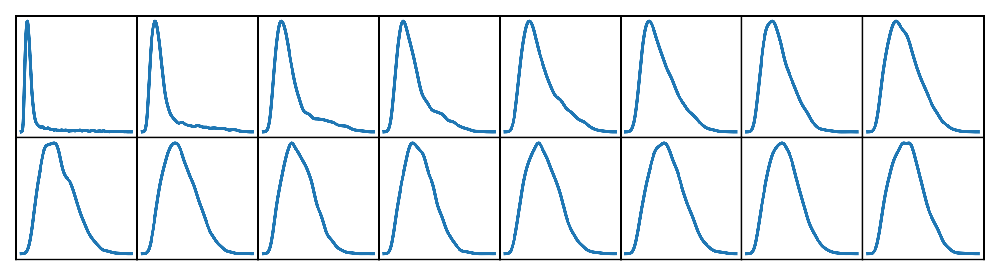

In [87]:

fig, axs = plt.subplots(2, 8, dpi = 480, figsize = (6.8,2))
fig.subplots_adjust(left=0, wspace=0, hspace=0)

ax1 = axs[0, 0]
kde1 = sm.nonparametric.KDEUnivariate(AllDat[str(0)])
kde1.fit()
ax1.set_xticks([]) 
ax1.set_yticks([])

ax2 = axs[0, 1]
kde2 = sm.nonparametric.KDEUnivariate(AllDat[str(2)])
kde2.fit()
ax2.set_xticks([]) 
ax2.set_yticks([])

ax3 = axs[0, 2]
kde3 = sm.nonparametric.KDEUnivariate(AllDat[str(3)])
kde3.fit()
ax3.set_xticks([]) 
ax3.set_yticks([])

ax4 = axs[0, 3]
kde4 = sm.nonparametric.KDEUnivariate(AllDat[str(4)])
kde4.fit()
ax4.set_xticks([]) 
ax4.set_yticks([])

ax5 = axs[0, 4]
kde5 = sm.nonparametric.KDEUnivariate(AllDat[str(5)])
kde5.fit()
ax5.set_xticks([]) 
ax5.set_yticks([])

ax6 = axs[0, 5]
kde6 = sm.nonparametric.KDEUnivariate(AllDat[str(6)])
kde6.fit()
ax6.set_xticks([]) 
ax6.set_yticks([])

ax7 = axs[0, 6]
kde7 = sm.nonparametric.KDEUnivariate(AllDat[str(7)])
kde7.fit()
ax7.set_xticks([]) 
ax7.set_yticks([])

ax8 = axs[0, 7]
kde8 = sm.nonparametric.KDEUnivariate(AllDat[str(8)])
kde8.fit()
ax8.set_xticks([]) 
ax8.set_yticks([])

ax9 = axs[1, 0]
kde9 = sm.nonparametric.KDEUnivariate(AllDat[str(9)])
kde9.fit()
ax9.set_xticks([]) 
ax9.set_yticks([])

ax10 = axs[1, 1]
kde10 = sm.nonparametric.KDEUnivariate(AllDat[str(10)])
kde10.fit()
ax10.set_xticks([]) 
ax10.set_yticks([])

ax11 = axs[1, 2]
kde11 = sm.nonparametric.KDEUnivariate(AllDat[str(11)])
kde11.fit()
ax11.set_xticks([]) 
ax11.set_yticks([])

ax12 = axs[1, 3]
kde12 = sm.nonparametric.KDEUnivariate(AllDat[str(12)])
kde12.fit()
ax12.set_xticks([]) 
ax12.set_yticks([])

ax13 = axs[1, 4]
kde13 = sm.nonparametric.KDEUnivariate(AllDat[str(13)])
kde13.fit()
ax13.set_xticks([]) 
ax13.set_yticks([])

ax14 = axs[1, 5]
kde14 = sm.nonparametric.KDEUnivariate(AllDat[str(14)])
kde14.fit()
ax14.set_xticks([]) 
ax14.set_yticks([])

ax15 = axs[1, 6]
kde15 = sm.nonparametric.KDEUnivariate(AllDat[str(15)])
kde15.fit()
ax15.set_xticks([]) 
ax15.set_yticks([])

ax16 = axs[1, 7]
kde16 = sm.nonparametric.KDEUnivariate(AllDat[str(16)])
kde16.fit()
ax16.set_xticks([]) 
ax16.set_yticks([])




ax1.plot(kde1.support, kde1.density)
ax2.plot(kde2.support, kde2.density)
ax3.plot(kde3.support, kde3.density)
ax4.plot(kde4.support, kde4.density)
ax5.plot(kde5.support, kde5.density)
ax6.plot(kde6.support, kde6.density)
ax7.plot(kde7.support, kde7.density)
ax8.plot(kde8.support, kde8.density)
ax9.plot(kde9.support, kde9.density)
ax10.plot(kde10.support, kde10.density)
ax11.plot(kde11.support, kde11.density)
ax12.plot(kde12.support, kde12.density)
ax13.plot(kde13.support, kde13.density)
ax14.plot(kde14.support, kde14.density)
ax15.plot(kde15.support, kde15.density)
ax16.plot(kde16.support, kde16.density)


plt.show()


fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/KDE_4a.png', bbox_inches='tight', pad_inches=0)

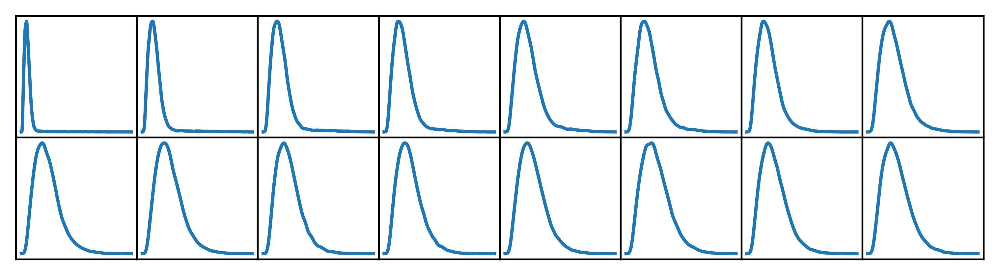

In [88]:

fig, axs = plt.subplots(2, 8, dpi = 480, figsize = (6.8,2))
fig.subplots_adjust(left=0, wspace=0, hspace=0)

ax1 = axs[0, 0]
kde1 = sm.nonparametric.KDEUnivariate(AllImg[str(0)])
kde1.fit()
ax1.set_xticks([]) 
ax1.set_yticks([])

ax2 = axs[0, 1]
kde2 = sm.nonparametric.KDEUnivariate(AllImg[str(2)])
kde2.fit()
ax2.set_xticks([]) 
ax2.set_yticks([])

ax3 = axs[0, 2]
kde3 = sm.nonparametric.KDEUnivariate(AllImg[str(3)])
kde3.fit()
ax3.set_xticks([]) 
ax3.set_yticks([])

ax4 = axs[0, 3]
kde4 = sm.nonparametric.KDEUnivariate(AllImg[str(4)])
kde4.fit()
ax4.set_xticks([]) 
ax4.set_yticks([])

ax5 = axs[0, 4]
kde5 = sm.nonparametric.KDEUnivariate(AllImg[str(5)])
kde5.fit()
ax5.set_xticks([]) 
ax5.set_yticks([])

ax6 = axs[0, 5]
kde6 = sm.nonparametric.KDEUnivariate(AllImg[str(6)])
kde6.fit()
ax6.set_xticks([]) 
ax6.set_yticks([])

ax7 = axs[0, 6]
kde7 = sm.nonparametric.KDEUnivariate(AllImg[str(7)])
kde7.fit()
ax7.set_xticks([]) 
ax7.set_yticks([])

ax8 = axs[0, 7]
kde8 = sm.nonparametric.KDEUnivariate(AllImg[str(8)])
kde8.fit()
ax8.set_xticks([]) 
ax8.set_yticks([])

ax9 = axs[1, 0]
kde9 = sm.nonparametric.KDEUnivariate(AllImg[str(9)])
kde9.fit()
ax9.set_xticks([]) 
ax9.set_yticks([])

ax10 = axs[1, 1]
kde10 = sm.nonparametric.KDEUnivariate(AllImg[str(10)])
kde10.fit()
ax10.set_xticks([]) 
ax10.set_yticks([])

ax11 = axs[1, 2]
kde11 = sm.nonparametric.KDEUnivariate(AllImg[str(11)])
kde11.fit()
ax11.set_xticks([]) 
ax11.set_yticks([])

ax12 = axs[1, 3]
kde12 = sm.nonparametric.KDEUnivariate(AllImg[str(12)])
kde12.fit()
ax12.set_xticks([]) 
ax12.set_yticks([])

ax13 = axs[1, 4]
kde13 = sm.nonparametric.KDEUnivariate(AllImg[str(13)])
kde13.fit()
ax13.set_xticks([]) 
ax13.set_yticks([])

ax14 = axs[1, 5]
kde14 = sm.nonparametric.KDEUnivariate(AllImg[str(14)])
kde14.fit()
ax14.set_xticks([]) 
ax14.set_yticks([])

ax15 = axs[1, 6]
kde15 = sm.nonparametric.KDEUnivariate(AllImg[str(15)])
kde15.fit()
ax15.set_xticks([]) 
ax15.set_yticks([])

ax16 = axs[1, 7]
kde16 = sm.nonparametric.KDEUnivariate(AllImg[str(16)])
kde16.fit()
ax16.set_xticks([]) 
ax16.set_yticks([])




ax1.plot(kde1.support, kde1.density)
ax2.plot(kde2.support, kde2.density)
ax3.plot(kde3.support, kde3.density)
ax4.plot(kde4.support, kde4.density)
ax5.plot(kde5.support, kde5.density)
ax6.plot(kde6.support, kde6.density)
ax7.plot(kde7.support, kde7.density)
ax8.plot(kde8.support, kde8.density)
ax9.plot(kde9.support, kde9.density)
ax10.plot(kde10.support, kde10.density)
ax11.plot(kde11.support, kde11.density)
ax12.plot(kde12.support, kde12.density)
ax13.plot(kde13.support, kde13.density)
ax14.plot(kde14.support, kde14.density)
ax15.plot(kde15.support, kde15.density)
ax16.plot(kde16.support, kde16.density)


plt.show()


fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/KDE_4b.png', bbox_inches='tight', pad_inches=0)

# EXPERIMENT 5
Eppendorf full of water (overnight)

## Extract Masks

In [2]:
patM = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing'

MS = np.asarray(Image.open(patM+'/MaskScaffold_5.png'))/255
ME = np.asarray(Image.open(patM+'/MaskEppen_5.png'))/255
MB = np.asarray(Image.open(patM+'/MaskBack_5.png'))/255


In [3]:
MA = np.asarray(Image.open(patM+'/MaskAll_5.png'))/255


In [4]:
pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/0_5eppendorf_2'
fol = '204'

ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

# ds.astype(np.int64) 

ds


Array([[198.02287 , 487.061   , 568.9042  , ..., 200.60986 ,  90.78008 ,
        135.46457 ],
       [208.60603 , 125.82213 ,  65.85084 , ..., 204.37277 , 104.18543 ,
        169.80109 ],
       [109.35942 , 606.29803 , 659.91943 , ..., 319.84692 , 170.97699 ,
         84.430176],
       ...,
       [337.7207  , 242.94255 , 206.48941 , ..., 265.2848  , 209.0764  ,
        322.19873 ],
       [118.296326,  22.342247, 121.82404 , ...,  11.994259, 217.07257 ,
        179.9139  ],
       [402.866   ,  21.401522, 256.58307 , ..., 146.04774 ,  66.55638 ,
        435.08588 ]], dtype=float32)

### Extract Data

In [92]:
# pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/0_5eppendorf_2'
# # fol = '12'
# ScaffDat = dict()
# EppenDat = dict()
# BackgDat = dict()

# for k in range(0,30):
#     fol = str(list(range(204, 234))[k])
#     ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

#     ScaffDat[str(k)] = [(ds*MS)[i,j] for i in range(0,np.shape(MS)[0]) for j in range(0,np.shape(MS)[1]) if (ds*MS)[i,j] != 0]
#     EppenDat[str(k)] = [(ds*ME)[i,j] for i in range(0,np.shape(ME)[0]) for j in range(0,np.shape(ME)[1]) if (ds*ME)[i,j] != 0]
#     BackgDat[str(k)] = [(ds*MB)[i,j] for i in range(0,np.shape(MB)[0]) for j in range(0,np.shape(MB)[1]) if (ds*MB)[i,j] != 0]

In [93]:
# AllDat = dict()
# for k in range(0,30):
#     fol = str(list(range(204, 234))[k])
#     ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

#     AllDat[str(k)] = [(ds*MA)[i,j] for i in range(0,np.shape(MA)[0]) for j in range(0,np.shape(MA)[1]) if (ds*MA)[i,j] != 0]

In [5]:
exper = '5'

pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/0_5eppendorf_2'
# fol = '12'
ScaffDat = dict()
EppenDat = dict()
BackgDat = dict()
AllDat = dict()

if os.path.exists(pat+'/tmpDat') == False:
    os.mkdir(pat+'/tmpDat')


if os.path.exists(pat+'/tmpDat/ScaffDat'+exper+'.csv'):
    df2 = pd.read_csv(pat+'/tmpDat/ScaffDat'+exper+'.csv')
    ScaffDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/EppenDat'+exper+'.csv')
    EppenDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/BackgDat'+exper+'.csv')
    BackgDat=df2.to_dict(orient='list')

    df2 = pd.read_csv(pat+'/tmpDat/AllDat'+exper+'.csv')
    AllDat=df2.to_dict(orient='list')

else:
    for k in range(0,30):
        fol = str(list(range(204, 234))[k])
        ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

        ScaffDat[str(k)] = [(ds*MS)[i,j] for i in range(0,np.shape(MS)[0]) for j in range(0,np.shape(MS)[1]) if (ds*MS)[i,j] != 0]
        EppenDat[str(k)] = [(ds*ME)[i,j] for i in range(0,np.shape(ME)[0]) for j in range(0,np.shape(ME)[1]) if (ds*ME)[i,j] != 0]
        BackgDat[str(k)] = [(ds*MB)[i,j] for i in range(0,np.shape(MB)[0]) for j in range(0,np.shape(MB)[1]) if (ds*MB)[i,j] != 0]
        AllDat[str(k)] = [(ds*MA)[i,j] for i in range(0,np.shape(MA)[0]) for j in range(0,np.shape(MA)[1]) if (ds*MA)[i,j] != 0]

    df = pd.DataFrame.from_dict(ScaffDat)
    df.to_csv(pat+'/tmpDat/ScaffDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(EppenDat)
    df.to_csv(pat+'/tmpDat/EppenDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(BackgDat)
    df.to_csv(pat+'/tmpDat/BackgDat'+exper+'.csv', index=False)

    
    df = pd.DataFrame.from_dict(AllDat)
    df.to_csv(pat+'/tmpDat/AllDat'+exper+'.csv', index=False)

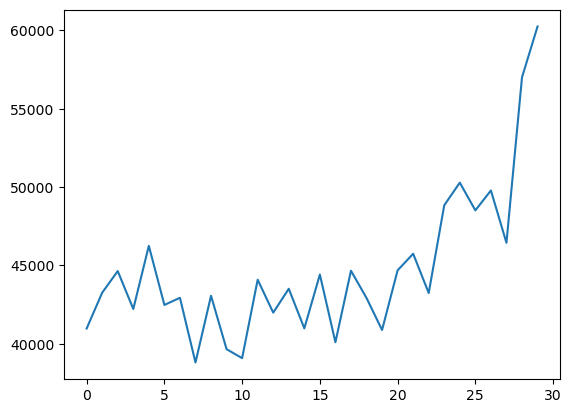

In [28]:
plt.plot([np.sum(ds[k]) for k in range(30)])

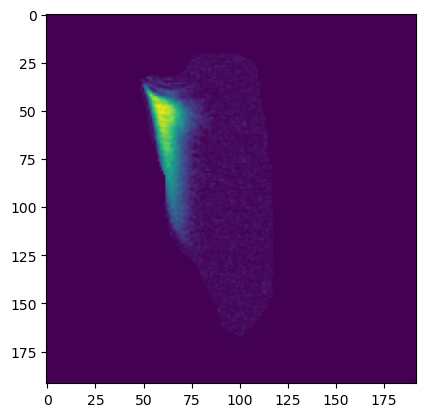

In [6]:
k=0
fol = str(list(range(204, 234))[k])
ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

plt.imshow(ds*MA)

In [7]:
AllImg = dict()
for k in range(0,30):
    fol = str(list(range(204, 234))[k])
    ds = imageio.v2.imread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm')

    AllImg[str(k)] = [(ds)[i,j] for i in range(0,np.shape(MA)[0]) for j in range(0,np.shape(MA)[1]) if (ds)[i,j] != 0]

In [8]:
kde1 = sm.nonparametric.KDEUnivariate(AllDat[str(0)])
kde1.fit()

329.27933
216.83739


(array([35477.,   414.,   254.,   164.,   134.,   111.,   103.,    96.,
           74.,    37.]),
 array([9.40726221e-01, 7.71442566e+02, 1.54194434e+03, 2.31244629e+03,
        3.08294800e+03, 3.85344995e+03, 4.62395166e+03, 5.39445361e+03,
        6.16495557e+03, 6.93545703e+03, 7.70595898e+03]),
 <BarContainer object of 10 artists>)

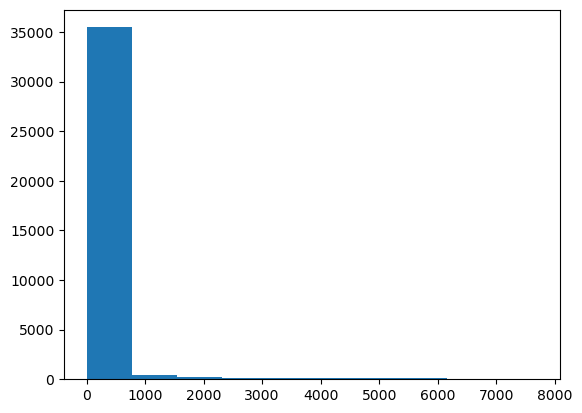

In [9]:
print(np.mean(AllImg['0']))
print(np.median(AllImg['0']))
plt.hist(AllImg['0'])


288.2368
229.7175


(array([1.4298e+04, 1.5707e+04, 3.8960e+03, 9.7800e+02, 6.0300e+02,
        5.9400e+02, 4.4600e+02, 2.4500e+02, 8.6000e+01, 1.1000e+01]),
 array([1.22624993e+00, 1.92433655e+02, 3.83641052e+02, 5.74848450e+02,
        7.66055847e+02, 9.57263245e+02, 1.14847070e+03, 1.33967810e+03,
        1.53088550e+03, 1.72209290e+03, 1.91330029e+03]),
 <BarContainer object of 10 artists>)

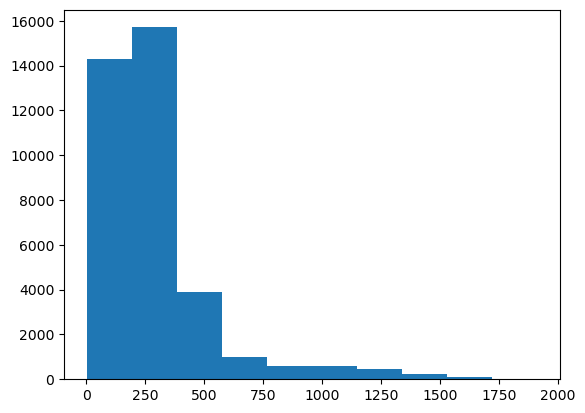

In [10]:
print(np.mean(AllImg['6']))
print(np.median(AllImg['6']))

plt.hist(AllImg['6'])

### Plot Data

In [20]:
SDM = [np.mean(ScaffDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 30)]
SDS = [np.std(ScaffDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 30)]

In [21]:
EDM = [np.mean(EppenDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 30)]
EDS = [np.std(EppenDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 30)]

In [22]:
FDM = [np.mean(AllDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 30)]
FDS = [np.std(AllDat[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 30)]

In [23]:
FDMb = [np.mean(AllImg[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 30)]
FDSb = [np.std(AllImg[str(k)] - np.mean(BackgDat[str(k)]))  for k in range(0, 30)]

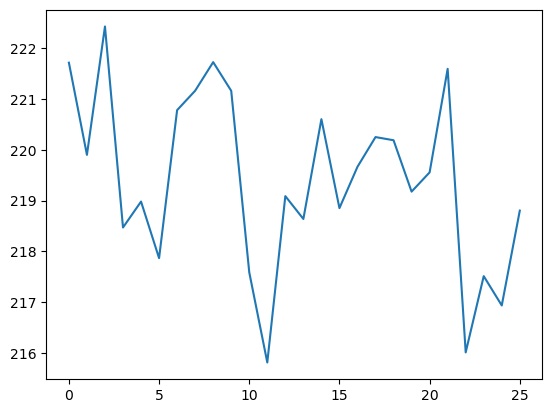

In [15]:
plt.plot([np.mean(BackgDat[str(k)])  for k in range(0, 26)])

(array([2., 1., 2., 2., 7., 3., 4., 3., 5., 1.]),
 array([215.81044463, 216.47279953, 217.13515443, 217.79750932,
        218.45986422, 219.12221912, 219.78457401, 220.44692891,
        221.1092838 , 221.7716387 , 222.4339936 ]),
 <BarContainer object of 10 artists>)

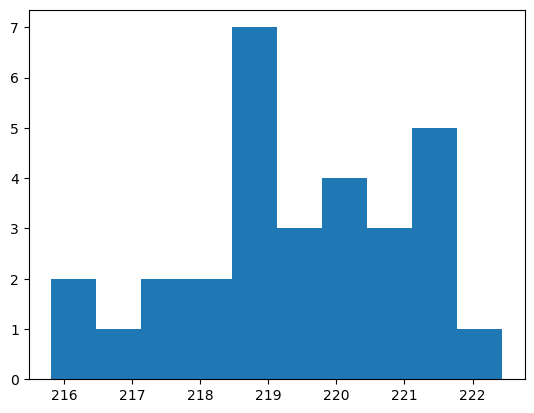

In [105]:
plt.hist([np.mean(BackgDat[str(k)])  for k in range(0, 30)])

In [18]:
tp = list(range(0,30))

tp


[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29]

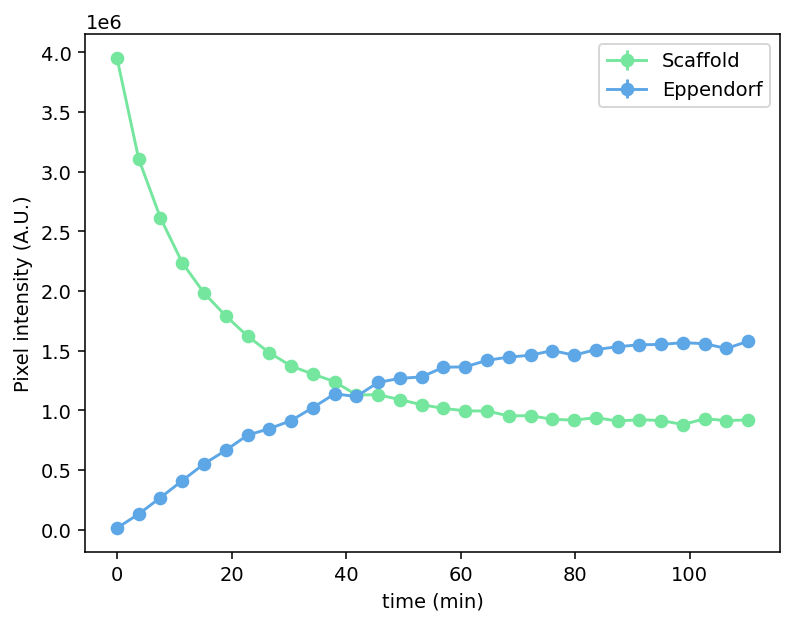

In [24]:
k = 0

plt.figure(dpi=140)

plt.errorbar([tp[i]*3.8 for i in range(0, len(tp))], SDM, yerr=SDS, fmt='-o', label='Scaffold', color='#75E69E')
plt.errorbar([tp[i]*3.8 for i in range(0, len(tp))], EDM, yerr=EDS, fmt='-o', label='Eppendorf', color='#5EA7E6')

plt.xlabel('time (min)')
plt.ylabel('Pixel intensity (A.U.)')

plt.legend()
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))


# plt.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/DatErr5.svg')

plt.show()

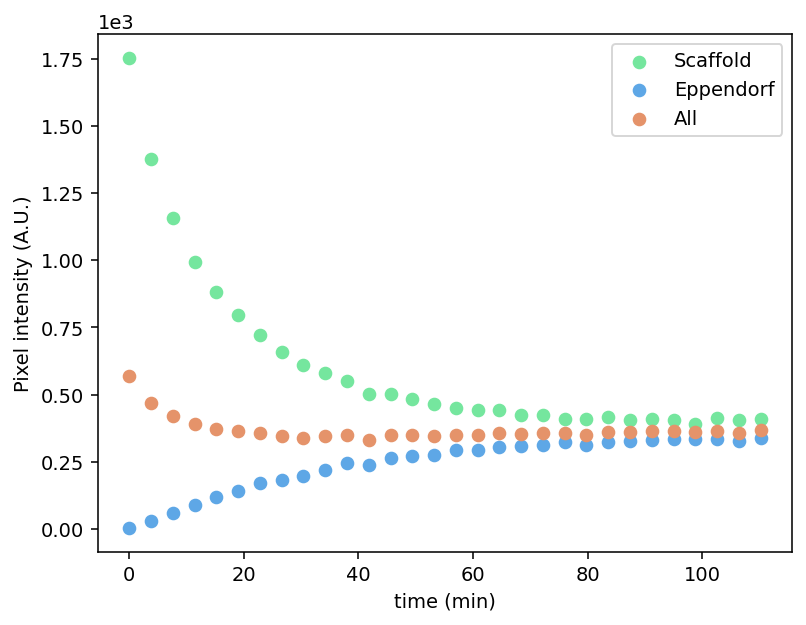

In [108]:
k = 0

plt.figure(dpi=140)

plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], SDM,  label='Scaffold', color='#75E69E')
plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], EDM,   label='Eppendorf', color='#5EA7E6')
plt.scatter([tp[i]*3.8 for i in range(0, len(tp))], FDM,   label='All', color='#E5936A')
# plt.scatter(tp, [FDMb[i]*10 for i in range(0,len(FDMb))],   label='All')

plt.xlabel('time (min)')
plt.ylabel('Pixel intensity (A.U.)')

plt.legend()
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

plt.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/DatAll5.svg')

plt.show()

In [19]:
pat = 'C:/IBECPostDocDrive/2023_07_25_ScaffoldDiffusionMRIProcessing/0_5eppendorf_2'
# fol = '12.'
Imagedict = dict()


for k in range(0,30):
    fol = str(list(range(204, 234))[k])
    Imagedict[str(k)] = dicom.dcmread(pat+'/'+fol+'/pdata/1/dicom/Eppendorf_Eppendorf_Difussion_scaffo_E'+fol+'_P1_Im1.dcm').pixel_array



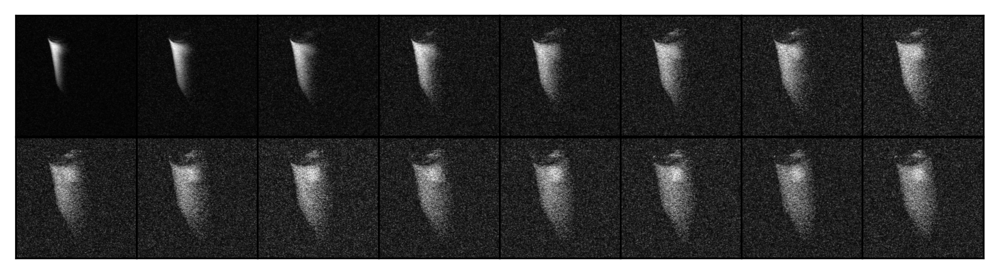

In [20]:

fig, axs = plt.subplots(2, 8, dpi = 480, figsize = (6.8,2))
fig.subplots_adjust(left=0, wspace=0, hspace=0)

ax1 = axs[0, 0]
ds1 = Imagedict['0']
ax1.set_xticks([]) 
ax1.set_yticks([])

ax2 = axs[0, 1]
ds2 = Imagedict['1']
ax2.set_xticks([]) 
ax2.set_yticks([])

ax3 = axs[0, 2]
ds3 = Imagedict['2']
ax3.set_xticks([]) 
ax3.set_yticks([])

ax4 = axs[0, 3]
ds4 = Imagedict['3']
ax4.set_xticks([]) 
ax4.set_yticks([])

ax5 = axs[0, 4]
ds5= Imagedict['4']
ax5.set_xticks([]) 
ax5.set_yticks([])

ax6 = axs[0, 5]
ds6 = Imagedict['5']
ax6.set_xticks([]) 
ax6.set_yticks([])

ax7 = axs[0, 6]
ds7 = Imagedict['6']
ax7.set_xticks([]) 
ax7.set_yticks([])

ax8 = axs[0, 7]
ds8 = Imagedict['7']
ax8.set_xticks([]) 
ax8.set_yticks([])

ax9 = axs[1, 0]
ds9 = Imagedict['8']
ax9.set_xticks([]) 
ax9.set_yticks([])

ax10 = axs[1, 1]
ds10 = Imagedict['9']
ax10.set_xticks([]) 
ax10.set_yticks([])

ax11 = axs[1, 2]
ds11 = Imagedict['10']
ax11.set_xticks([]) 
ax11.set_yticks([])

ax12 = axs[1, 3]
ds12 = Imagedict['11']
ax12.set_xticks([]) 
ax12.set_yticks([])

ax13 = axs[1, 4]
ds13= Imagedict['12']
ax13.set_xticks([]) 
ax13.set_yticks([])

ax14 = axs[1, 5]
ds14 = Imagedict['13']
ax14.set_xticks([]) 
ax14.set_yticks([])

ax15 = axs[1, 6]
ds15 = Imagedict['14']
ax15.set_xticks([]) 
ax15.set_yticks([])

ax16 = axs[1, 7]
ds16 = Imagedict['15']
ax16.set_xticks([]) 
ax16.set_yticks([])




ax1.imshow(ds1, cmap='gray')
ax2.imshow(ds2, cmap='gray')
ax3.imshow(ds3, cmap='gray')
ax4.imshow(ds4, cmap='gray')
ax5.imshow(ds5, cmap='gray')
ax6.imshow(ds6, cmap='gray')
ax7.imshow(ds7, cmap='gray')
ax8.imshow(ds8, cmap='gray')
ax9.imshow(ds9, cmap='gray')
ax10.imshow(ds10, cmap='gray')
ax11.imshow(ds11, cmap='gray')
ax12.imshow(ds12, cmap='gray')
ax13.imshow(ds13, cmap='gray')
ax14.imshow(ds14, cmap='gray')
ax15.imshow(ds15, cmap='gray')
ax16.imshow(ds16, cmap='gray')


plt.show()


fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/MRI_5.png', bbox_inches='tight', pad_inches=0)

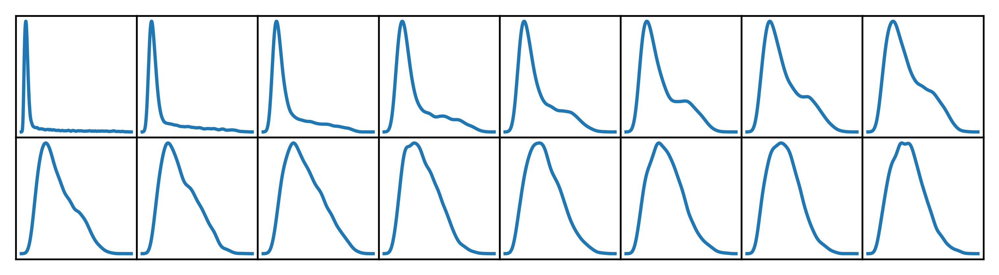

In [21]:

fig, axs = plt.subplots(2, 8, dpi = 480, figsize = (6.8,2))
fig.subplots_adjust(left=0, wspace=0, hspace=0)

ax1 = axs[0, 0]
kde1 = sm.nonparametric.KDEUnivariate(AllDat[str(0)])
kde1.fit()
ax1.set_xticks([]) 
ax1.set_yticks([])

ax2 = axs[0, 1]
kde2 = sm.nonparametric.KDEUnivariate(AllDat[str(1)])
kde2.fit()
ax2.set_xticks([]) 
ax2.set_yticks([])

ax3 = axs[0, 2]
kde3 = sm.nonparametric.KDEUnivariate(AllDat[str(2)])
kde3.fit()
ax3.set_xticks([]) 
ax3.set_yticks([])

ax4 = axs[0, 3]
kde4 = sm.nonparametric.KDEUnivariate(AllDat[str(3)])
kde4.fit()
ax4.set_xticks([]) 
ax4.set_yticks([])

ax5 = axs[0, 4]
kde5 = sm.nonparametric.KDEUnivariate(AllDat[str(4)])
kde5.fit()
ax5.set_xticks([]) 
ax5.set_yticks([])

ax6 = axs[0, 5]
kde6 = sm.nonparametric.KDEUnivariate(AllDat[str(5)])
kde6.fit()
ax6.set_xticks([]) 
ax6.set_yticks([])

ax7 = axs[0, 6]
kde7 = sm.nonparametric.KDEUnivariate(AllDat[str(6)])
kde7.fit()
ax7.set_xticks([]) 
ax7.set_yticks([])

ax8 = axs[0, 7]
kde8 = sm.nonparametric.KDEUnivariate(AllDat[str(7)])
kde8.fit()
ax8.set_xticks([]) 
ax8.set_yticks([])

ax9 = axs[1, 0]
kde9 = sm.nonparametric.KDEUnivariate(AllDat[str(8)])
kde9.fit()
ax9.set_xticks([]) 
ax9.set_yticks([])

ax10 = axs[1, 1]
kde10 = sm.nonparametric.KDEUnivariate(AllDat[str(9)])
kde10.fit()
ax10.set_xticks([]) 
ax10.set_yticks([])

ax11 = axs[1, 2]
kde11 = sm.nonparametric.KDEUnivariate(AllDat[str(10)])
kde11.fit()
ax11.set_xticks([]) 
ax11.set_yticks([])

ax12 = axs[1, 3]
kde12 = sm.nonparametric.KDEUnivariate(AllDat[str(11)])
kde12.fit()
ax12.set_xticks([]) 
ax12.set_yticks([])

ax13 = axs[1, 4]
kde13 = sm.nonparametric.KDEUnivariate(AllDat[str(12)])
kde13.fit()
ax13.set_xticks([]) 
ax13.set_yticks([])

ax14 = axs[1, 5]
kde14 = sm.nonparametric.KDEUnivariate(AllDat[str(13)])
kde14.fit()
ax14.set_xticks([]) 
ax14.set_yticks([])

ax15 = axs[1, 6]
kde15 = sm.nonparametric.KDEUnivariate(AllDat[str(14)])
kde15.fit()
ax15.set_xticks([]) 
ax15.set_yticks([])

ax16 = axs[1, 7]
kde16 = sm.nonparametric.KDEUnivariate(AllDat[str(15)])
kde16.fit()
ax16.set_xticks([]) 
ax16.set_yticks([])




ax1.plot(kde1.support, kde1.density)
ax2.plot(kde2.support, kde2.density)
ax3.plot(kde3.support, kde3.density)
ax4.plot(kde4.support, kde4.density)
ax5.plot(kde5.support, kde5.density)
ax6.plot(kde6.support, kde6.density)
ax7.plot(kde7.support, kde7.density)
ax8.plot(kde8.support, kde8.density)
ax9.plot(kde9.support, kde9.density)
ax10.plot(kde10.support, kde10.density)
ax11.plot(kde11.support, kde11.density)
ax12.plot(kde12.support, kde12.density)
ax13.plot(kde13.support, kde13.density)
ax14.plot(kde14.support, kde14.density)
ax15.plot(kde15.support, kde15.density)
ax16.plot(kde16.support, kde16.density)


plt.show()


# fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/KDE_5a.png', bbox_inches='tight', pad_inches=0)

1.2934688329696655

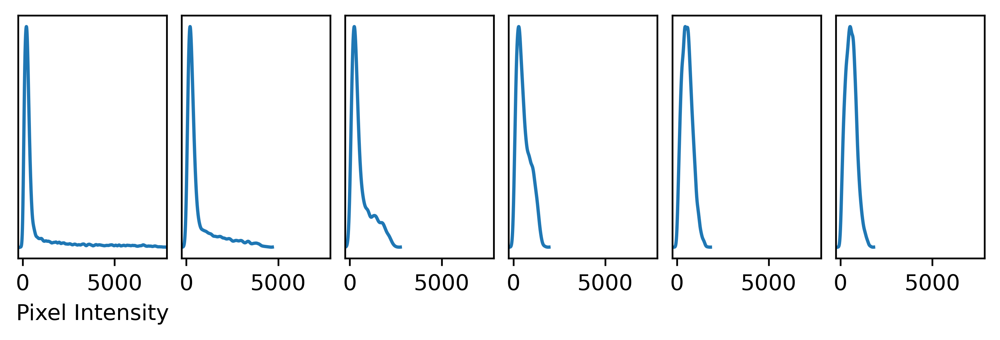

In [50]:

fig, axs = plt.subplots(1, 6, dpi = 480, figsize = (6.8,2))
fig.subplots_adjust(left=0, wspace=0.1, hspace=0.1)

ax1 = axs[0]
kde1 = sm.nonparametric.KDEUnivariate(AllDat[str(0)])
kde1.fit()
# ax1.set_xticks([]) 
ax1.set_yticks([])
# ax1.set_ylim(np.min([AllDat[str(0)], AllDat[str(1)], AllDat[str(3)], AllDat[str(7)], AllDat[str(15)], AllDat[str(24)]]), 
#              np.max([AllDat[str(0)], AllDat[str(1)], AllDat[str(3)], AllDat[str(7)], AllDat[str(15)], AllDat[str(24)]]))



ax2 = axs[1]
kde2 = sm.nonparametric.KDEUnivariate(AllDat[str(1)])
kde2.fit()
# ax2.set_xticks([]) 
ax2.set_yticks([])

ax3 = axs[2]
kde3 = sm.nonparametric.KDEUnivariate(AllDat[str(3)])
kde3.fit()
# ax3.set_xticks([]) 
ax3.set_yticks([])

ax4 = axs[3]
kde4 = sm.nonparametric.KDEUnivariate(AllDat[str(7)])
kde4.fit()
# ax4.set_xticks([]) 
ax4.set_yticks([])

ax5 = axs[4]
kde5 = sm.nonparametric.KDEUnivariate(AllDat[str(15)])
kde5.fit()
# ax5.set_xticks([]) 
ax5.set_yticks([])

ax6 = axs[5]
kde6 = sm.nonparametric.KDEUnivariate(AllDat[str(24)])
kde6.fit()
# ax6.set_xticks([]) 
ax6.set_yticks([])




ax1.plot(kde1.support, kde1.density)
ax2.plot(kde2.support, kde2.density)
ax3.plot(kde3.support, kde3.density)
ax4.plot(kde4.support, kde4.density)
ax5.plot(kde5.support, kde5.density)
ax6.plot(kde6.support, kde6.density)

ax1.set_xlim(np.min([kde1.support,kde2.support,kde3.support,kde4.support,kde5.support,kde6.support]), np.max([kde1.support,kde2.support,kde3.support,kde4.support,kde5.support,kde6.support]))
ax2.set_xlim(np.min([kde1.support,kde2.support,kde3.support,kde4.support,kde5.support,kde6.support]), np.max([kde1.support,kde2.support,kde3.support,kde4.support,kde5.support,kde6.support]))
ax3.set_xlim(np.min([kde1.support,kde2.support,kde3.support,kde4.support,kde5.support,kde6.support]), np.max([kde1.support,kde2.support,kde3.support,kde4.support,kde5.support,kde6.support]))
ax4.set_xlim(np.min([kde1.support,kde2.support,kde3.support,kde4.support,kde5.support,kde6.support]), np.max([kde1.support,kde2.support,kde3.support,kde4.support,kde5.support,kde6.support]))
ax5.set_xlim(np.min([kde1.support,kde2.support,kde3.support,kde4.support,kde5.support,kde6.support]), np.max([kde1.support,kde2.support,kde3.support,kde4.support,kde5.support,kde6.support]))
ax6.set_xlim(np.min([kde1.support,kde2.support,kde3.support,kde4.support,kde5.support,kde6.support]), np.max([kde1.support,kde2.support,kde3.support,kde4.support,kde5.support,kde6.support]))

ax1.set_xlabel('Pixel Intensity')

plt.show()


# fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/KDE_5a.png', bbox_inches='tight', pad_inches=0)

fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/KDE_5a_Final.svg', bbox_inches='tight', pad_inches=0)



array([-130.11496067, -129.14203352, -128.16910638, ..., 7837.18545092,
       7838.15837807, 7839.13130522])

In [ ]:
np.std(ScaffDat[str(k)])

6687.790643275292

In [ ]:
np.median()

TypeError: _median_dispatcher() missing 1 required positional argument: 'a'

(array([12502.,   726.,   251.,   197.,   157.,   138.,   148.,   178.,
          115.,    56.]),
 array([1.00000e+00, 3.27750e+03, 6.55400e+03, 9.83050e+03, 1.31070e+04,
        1.63835e+04, 1.96600e+04, 2.29365e+04, 2.62130e+04, 2.94895e+04,
        3.27660e+04]),
 <BarContainer object of 10 artists>)

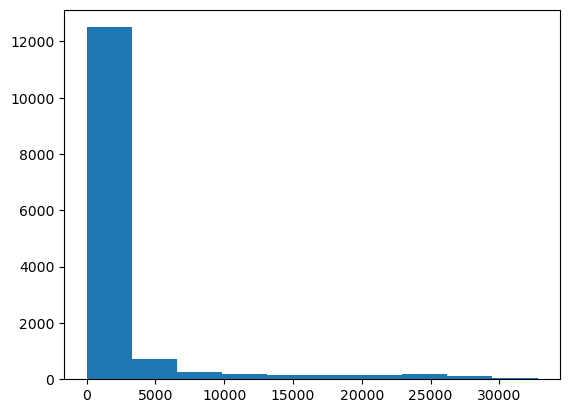

In [ ]:
plt.hist(AllDat[str(0)])

(array([2172., 4218., 3554., 2135., 1145.,  662.,  365.,  160.,   43.,
          14.]),
 array([   79. ,  3347.7,  6616.4,  9885.1, 13153.8, 16422.5, 19691.2,
        22959.9, 26228.6, 29497.3, 32766. ]),
 <BarContainer object of 10 artists>)

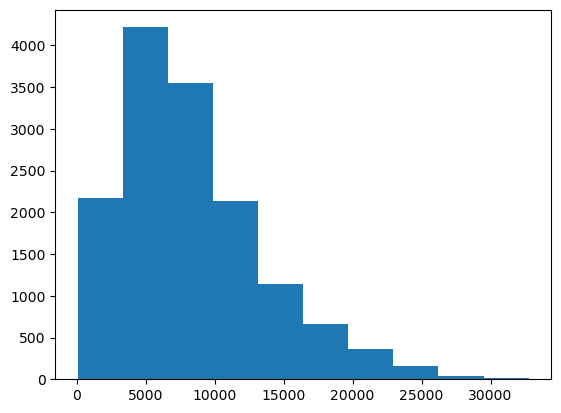

In [ ]:
plt.hist(AllDat[str(10)])

(array([1167., 2803., 3394., 3063., 2087., 1148.,  559.,  181.,   56.,
          10.]),
 array([  130. ,  3393.6,  6657.2,  9920.8, 13184.4, 16448. , 19711.6,
        22975.2, 26238.8, 29502.4, 32766. ]),
 <BarContainer object of 10 artists>)

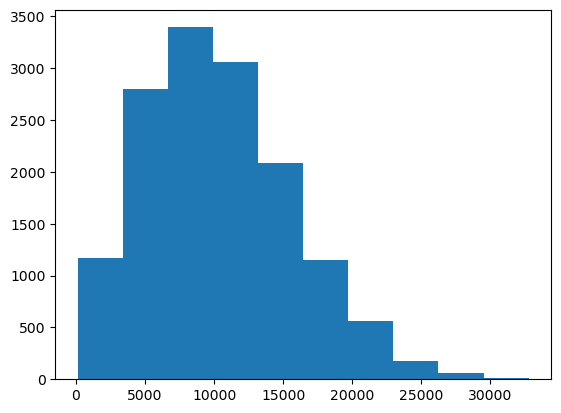

In [ ]:
plt.hist(AllDat[str(20)])

In [ ]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from statsmodels.distributions.mixture_rvs import mixture_rvs

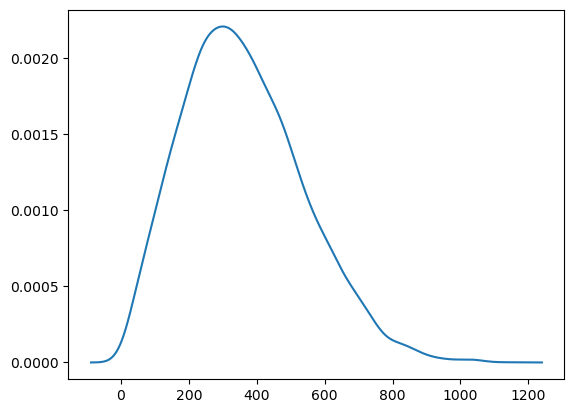

In [ ]:
kde = sm.nonparametric.KDEUnivariate(AllDat[str(20)])
kde.fit()

plt.plot(kde.support, kde.density)

In [ ]:
AllDat[str(0)]

[152.310302734375,
 113.50916290283203,
 249.9915008544922,
 118.12188720703125,
 89.99332427978516,
 36.540000915527344,
 110.25312042236328,
 12.029257774353027,
 283.6372375488281,
 246.0118865966797,
 201.331787109375,
 387.287841796875,
 340.617919921875,
 258.131591796875,
 45.94633865356445,
 307.2435302734375,
 306.0677490234375,
 334.1058654785156,
 240.1329345703125,
 202.05535888671875,
 290.1493225097656,
 41.87628936767578,
 230.45526123046875,
 128.88490295410156,
 172.38922119140625,
 214.8081817626953,
 184.599365234375,
 295.66650390625,
 187.85540771484375,
 220.41580200195312,
 37.173118591308594,
 268.8041687011719,
 234.9775390625,
 97.59074401855469,
 353.7325439453125,
 177.99684143066406,
 258.4029235839844,
 313.12249755859375,
 123.54862213134766,
 393.07635498046875,
 221.32025146484375,
 330.5784912109375,
 396.5132751464844,
 484.0645751953125,
 397.417724609375,
 95.7818374633789,
 164.7013397216797,
 120.11168670654297,
 184.96115112304688,
 141.185501098

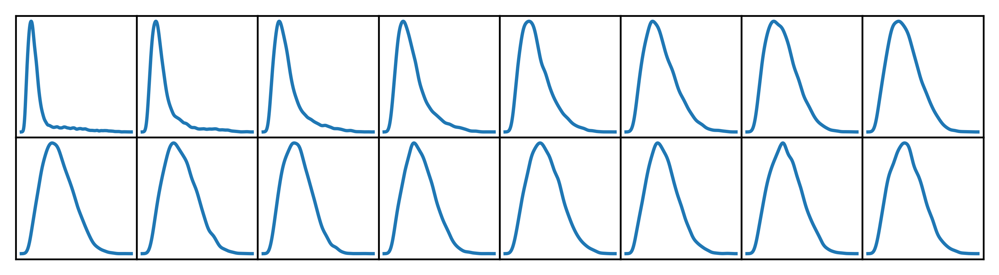

In [41]:

fig, axs = plt.subplots(2, 8, dpi = 480, figsize = (6.8,2))
fig.subplots_adjust(left=0, wspace=0, hspace=0)

ax1 = axs[0, 0]
kde1 = sm.nonparametric.KDEUnivariate(AllDat[str(0)])
kde1.fit()
ax1.set_xticks([]) 
ax1.set_yticks([])

ax2 = axs[0, 1]
kde2 = sm.nonparametric.KDEUnivariate(AllDat[str(1)])
kde2.fit()
ax2.set_xticks([]) 
ax2.set_yticks([])

ax3 = axs[0, 2]
kde3 = sm.nonparametric.KDEUnivariate(AllDat[str(2)])
kde3.fit()
ax3.set_xticks([]) 
ax3.set_yticks([])

ax4 = axs[0, 3]
kde4 = sm.nonparametric.KDEUnivariate(AllDat[str(3)])
kde4.fit()
ax4.set_xticks([]) 
ax4.set_yticks([])

ax5 = axs[0, 4]
kde5 = sm.nonparametric.KDEUnivariate(AllDat[str(4)])
kde5.fit()
ax5.set_xticks([]) 
ax5.set_yticks([])

ax6 = axs[0, 5]
kde6 = sm.nonparametric.KDEUnivariate(AllDat[str(5)])
kde6.fit()
ax6.set_xticks([]) 
ax6.set_yticks([])

ax7 = axs[0, 6]
kde7 = sm.nonparametric.KDEUnivariate(AllDat[str(6)])
kde7.fit()
ax7.set_xticks([]) 
ax7.set_yticks([])

ax8 = axs[0, 7]
kde8 = sm.nonparametric.KDEUnivariate(AllDat[str(7)])
kde8.fit()
ax8.set_xticks([]) 
ax8.set_yticks([])

ax9 = axs[1, 0]
kde9 = sm.nonparametric.KDEUnivariate(AllDat[str(8)])
kde9.fit()
ax9.set_xticks([]) 
ax9.set_yticks([])

ax10 = axs[1, 1]
kde10 = sm.nonparametric.KDEUnivariate(AllDat[str(9)])
kde10.fit()
ax10.set_xticks([]) 
ax10.set_yticks([])

ax11 = axs[1, 2]
kde11 = sm.nonparametric.KDEUnivariate(AllDat[str(10)])
kde11.fit()
ax11.set_xticks([]) 
ax11.set_yticks([])

ax12 = axs[1, 3]
kde12 = sm.nonparametric.KDEUnivariate(AllDat[str(11)])
kde12.fit()
ax12.set_xticks([]) 
ax12.set_yticks([])

ax13 = axs[1, 4]
kde13 = sm.nonparametric.KDEUnivariate(AllDat[str(12)])
kde13.fit()
ax13.set_xticks([]) 
ax13.set_yticks([])

ax14 = axs[1, 5]
kde14 = sm.nonparametric.KDEUnivariate(AllDat[str(13)])
kde14.fit()
ax14.set_xticks([]) 
ax14.set_yticks([])

ax15 = axs[1, 6]
kde15 = sm.nonparametric.KDEUnivariate(AllDat[str(14)])
kde15.fit()
ax15.set_xticks([]) 
ax15.set_yticks([])

ax16 = axs[1, 7]
kde16 = sm.nonparametric.KDEUnivariate(AllDat[str(15)])
kde16.fit()
ax16.set_xticks([]) 
ax16.set_yticks([])




ax1.plot(kde1.support, kde1.density)
ax2.plot(kde2.support, kde2.density)
ax3.plot(kde3.support, kde3.density)
ax4.plot(kde4.support, kde4.density)
ax5.plot(kde5.support, kde5.density)
ax6.plot(kde6.support, kde6.density)
ax7.plot(kde7.support, kde7.density)
ax8.plot(kde8.support, kde8.density)
ax9.plot(kde9.support, kde9.density)
ax10.plot(kde10.support, kde10.density)
ax11.plot(kde11.support, kde11.density)
ax12.plot(kde12.support, kde12.density)
ax13.plot(kde13.support, kde13.density)
ax14.plot(kde14.support, kde14.density)
ax15.plot(kde15.support, kde15.density)
ax16.plot(kde16.support, kde16.density)


plt.show()


fig.savefig(r'C:\IBECPostDocDrive\2023_07_25_ScaffoldDiffusionMRIProcessing/KDE.png', bbox_inches='tight', pad_inches=0)

In [24]:
np.size(MS)

36864

In [7]:
np.shape(ds.pixel_array)

(192, 192)

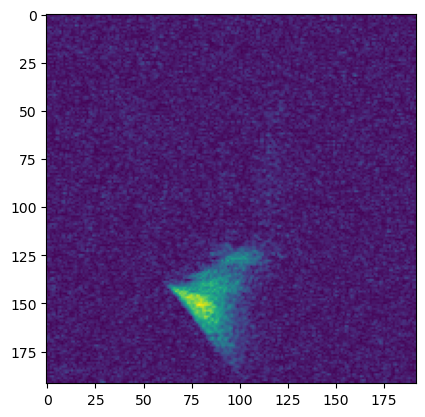

In [3]:
plt.imshow(ds.pixel_array)